## Dependencies

In [714]:
# Install torchinfo if a more detailed description of the models is required
# !pip install -q torchinfo


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [3]:
import torch
from pathlib import Path
import os
import random
from PIL import Image
import numpy as np
import torchvision
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
from torch import nn
from torchinfo import summary
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# Creating a model from scratch

## Data

#### Get images paths

In [4]:
data_path = Path('data/')
image_path = data_path / 'Henny_cats'

# Print out the initial training and testing images for each class
for dirpath, dirnames, filenames in os.walk(image_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)-1} images in --{dirpath}--")

There are 2 directories and 0 images in --data/Henny_cats--
There are 3 directories and 0 images in --data/Henny_cats/test--
There are 0 directories and 30 images in --data/Henny_cats/test/Yuki--
There are 0 directories and 18 images in --data/Henny_cats/test/Emiko--
There are 0 directories and 19 images in --data/Henny_cats/test/Sekai--
There are 3 directories and 0 images in --data/Henny_cats/train--
There are 0 directories and 111 images in --data/Henny_cats/train/Yuki--
There are 0 directories and 56 images in --data/Henny_cats/train/Emiko--
There are 0 directories and 23 images in --data/Henny_cats/train/Sekai--


In [6]:
# create folder paths
train_dir = image_path / 'train'
test_dir = image_path / 'test'

train_dir, test_dir

(PosixPath('data/Henny_cats/train'), PosixPath('data/Henny_cats/test'))

#### Visualize some data

Emiko
Random image path: data/Henny_cats/test/Emiko/20230717_201557 copy.jpg


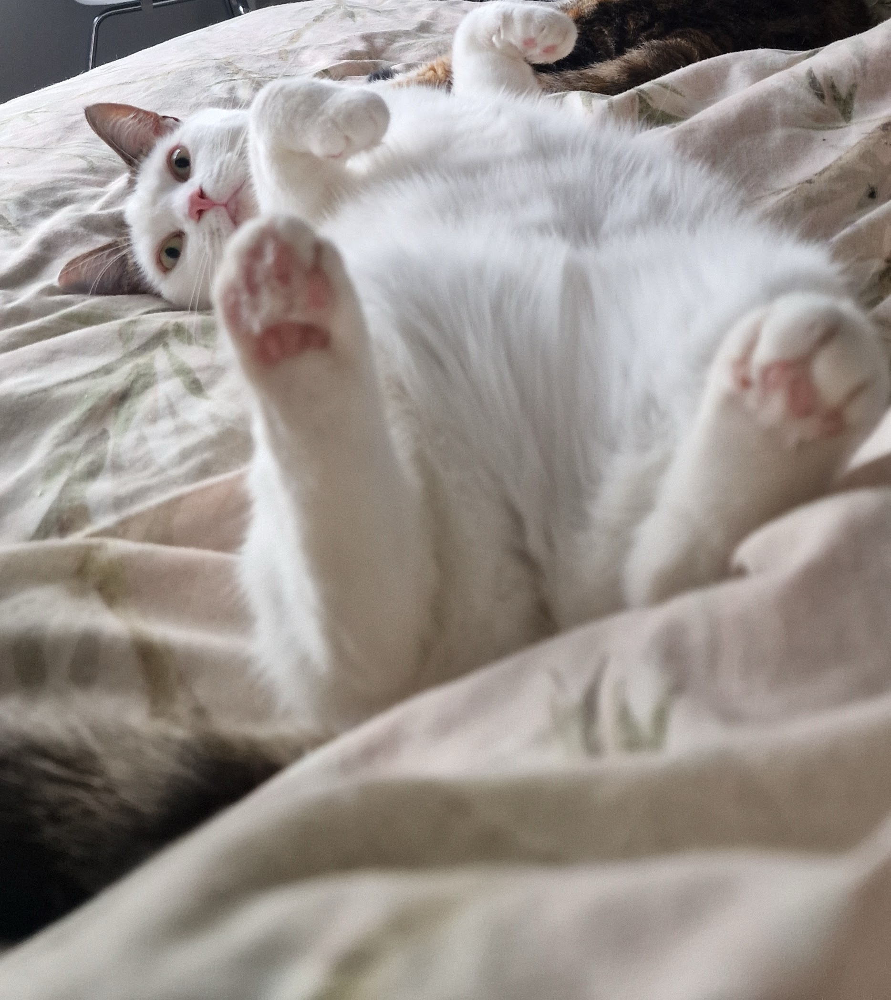

In [10]:
# Get all image paths
image_path_list = list(image_path.glob('*/*/*.jpg'))

random_image_path = random.choice(image_path_list)

# Get image class from path 
image_class = random_image_path.parent.stem
print(image_class)

# Open a random image
img = Image.open(random_image_path)

print(f'Random image path: {random_image_path}')
img

(-0.5, 1867.5, 2095.5, -0.5)

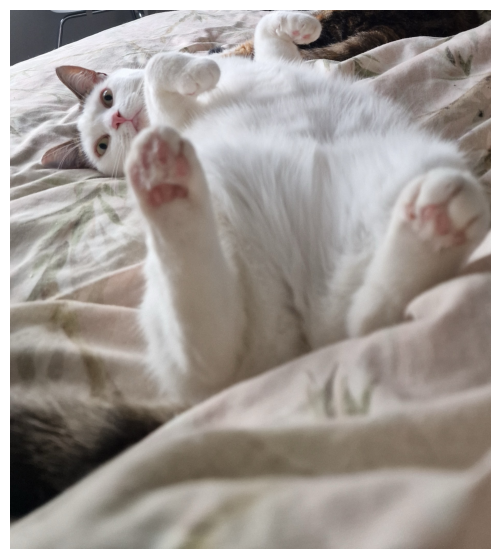

In [11]:
# Turn the image in an array
img_as_array = np.asarray(img)

# Plot with matplot lib
plt.figure(figsize=(10, 7))
plt.imshow(img_as_array)
plt.axis(False)

#### Transforming images into tensors - examples

In [758]:
data_transform = transforms.Compose([
    # Resize the image to a be 224x224
    transforms.Resize(size=(224, 224)),
    # Horizontally flip the image randomly 
    transforms.RandomHorizontalFlip(p=0.5),
    # Turn the image into a torch tensor
    transforms.ToTensor()
])

In [759]:
# Transforms the randomly choosen image and prints the shape of the new tensor
data_transform(img).shape

torch.Size([3, 224, 224])

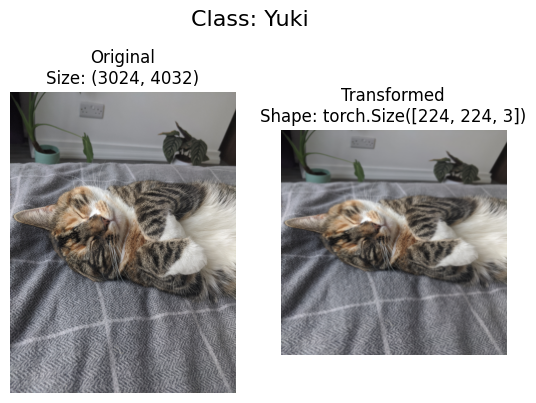

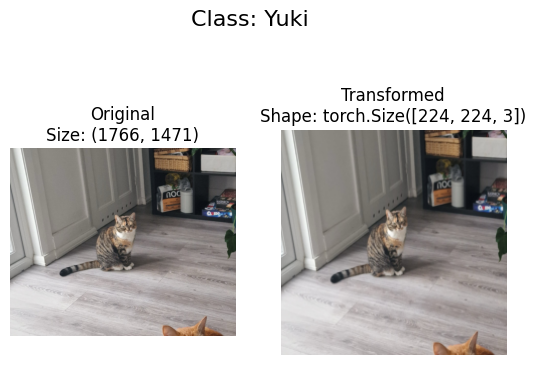

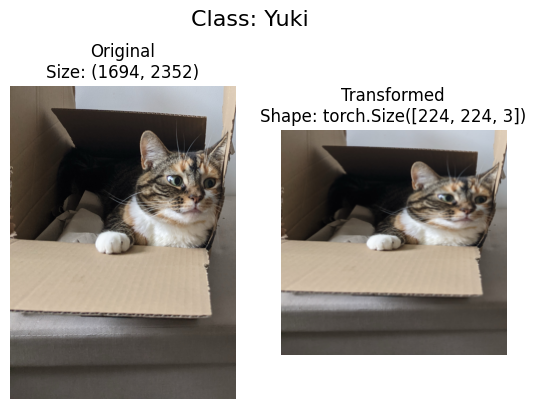

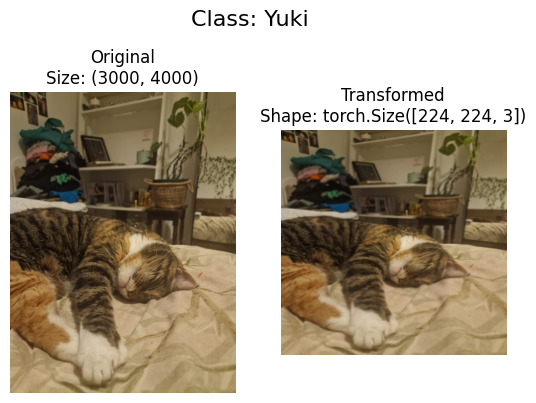

In [12]:
# Plot original vs transformed images
def plot_transformed_images(image_paths, 
                            transform, 
                            n, # Number of transformed images to display
                            seed):
    if seed:
        random.seed(seed)
    # Gets 'n' amount of random image paths
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(nrows=1, ncols=2)
            ax[0].imshow(f)
            ax[0].set_title(f'Original\nSize: {f.size}')
            ax[0].axis(False)

            # Transform and plot target image
            transformed_image = transform(f).permute(1, 2, 0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f'Transformed\nShape: {transformed_image.shape}')
            ax[1].axis('off')

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)


plot_transformed_images(image_path_list, data_transform, 4, None)

#### Rebalancing the train and test datasets

##### Initial state

In [15]:
# Getting the number of both train and test images for class 'Emiko'
emiko_train_path_list = list(image_path.glob('train/Emiko/*.jpg'))
emiko_test_path_list = list(image_path.glob('test/Emiko/*.jpg'))

print(f'Emiko has {len(emiko_train_path_list)} training images, and {len(emiko_test_path_list)} testing images')

Emiko has 55 training images, and 19 testing images


In [16]:
# Getting the number of both train and test images for class 'Sekai'
sekai_train_path_list = list(image_path.glob('train/Sekai/*.jpg'))
sekai_test_path_list = list(image_path.glob('test/Sekai/*.jpg'))

print(f'Sekai has {len(sekai_train_path_list) } training images, and {len(sekai_test_path_list)} testing images') 

Sekai has 22 training images, and 20 testing images


In [17]:
# Getting the number of both train and test images for class 'Yuki'
yuki_train_path_list = list(image_path.glob('train/Yuki/*.jpg'))
yuki_test_path_list = list(image_path.glob('test/Yuki/*.jpg'))

print(f'Yuki has {len(yuki_train_path_list) } training images, and {len(yuki_test_path_list)} testing images')  

Yuki has 111 training images, and 31 testing images


Yuki has **MANY** more training and testing images than any other class, that is why the training data must be rebalanced

##### Transforms for creating tensors

In [7]:
# Tensor size
SIZE = 224

# Transformation in size only 
data_transform = transforms.Compose([
    transforms.Resize(size=(SIZE, SIZE)),
    transforms.ToTensor()
])

# Flips the image horizontally
ver_data_transform = transforms.Compose([
    transforms.Resize(size=(SIZE, SIZE)),
    transforms.RandomHorizontalFlip(p=1),
    transforms.ToTensor()
])

# Flips the image vertically
hor_data_transform = transforms.Compose([
    transforms.Resize(size=(SIZE, SIZE)),
    transforms.RandomVerticalFlip(p=1),
    transforms.ToTensor()
])

# Generate augmented images from original images
augment_transform = transforms.Compose([
    transforms.Resize(size=(SIZE, SIZE)),
    transforms.TrivialAugmentWide(num_magnitude_bins=31),
    transforms.ToTensor()
])

##### Visualizing the transformed images

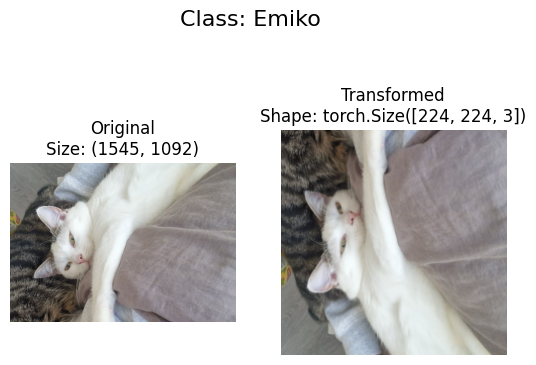

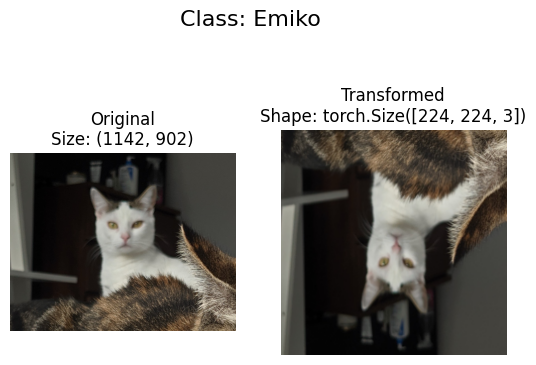

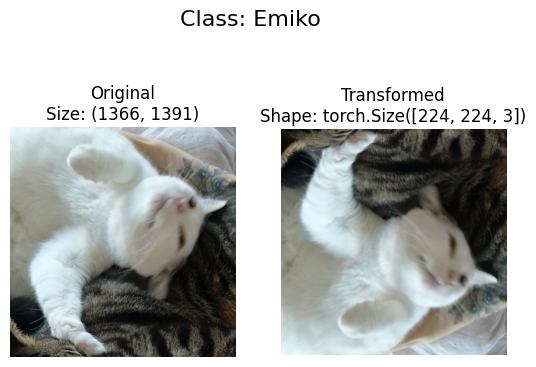

In [18]:
plot_transformed_images(emiko_test_path_list, hor_data_transform, 3, None)

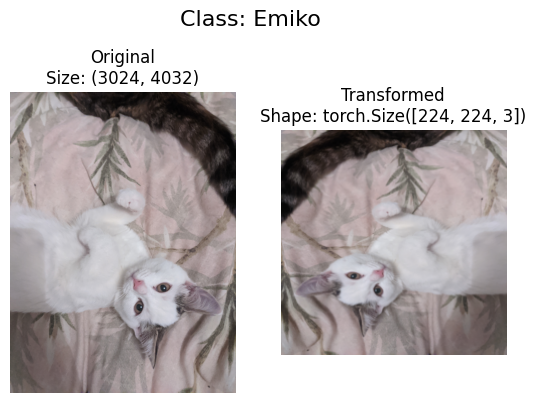

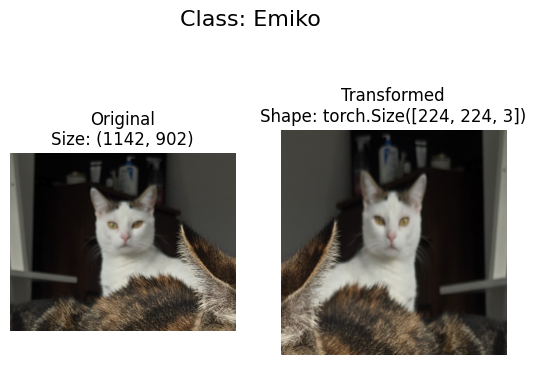

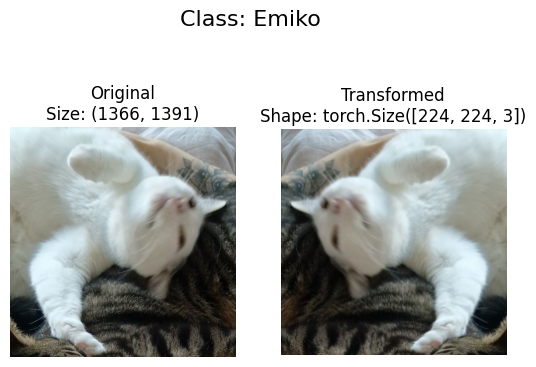

In [767]:
plot_transformed_images(emiko_test_path_list, ver_data_transform, 3, None)

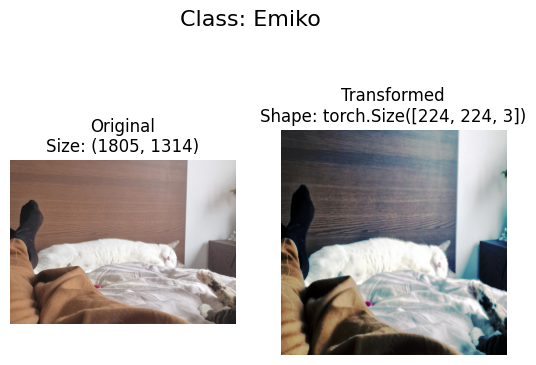

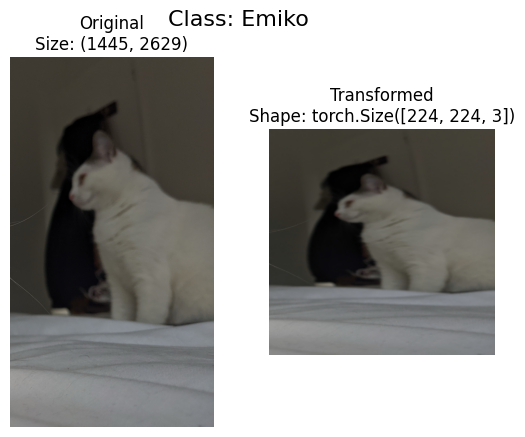

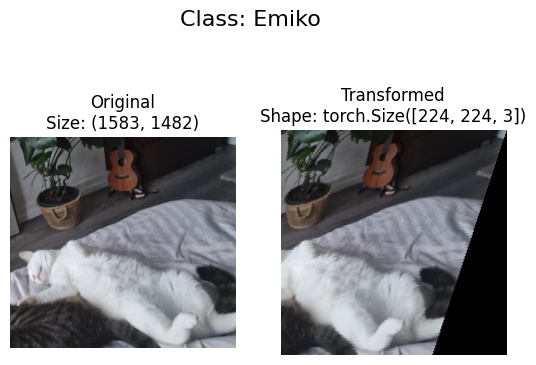

In [768]:
plot_transformed_images(emiko_test_path_list, augment_transform, 3, None)

##### Creating extra tensors and adding them to the original images tensors

In [5]:
# Function to generate more tensors of the same images
def generate_tensors(paths_list, num) -> torch.tensor:
    # Doubles the number of original images
    if num == 1:
        ver = torch.zeros(len(paths_list), 3, SIZE, SIZE)
        for i in range(len(paths_list)):
            img = Image.open(paths_list[i])
            ver[i] = ver_data_transform(img)
        return ver
    
    # Triples the number of original images
    elif num == 2:
        ver = torch.zeros(len(paths_list), 3, SIZE, SIZE)
        hor = torch.zeros(len(paths_list), 3, SIZE, SIZE)
        for i in range(len(paths_list)):
            img = Image.open(paths_list[i])
            ver[i] = ver_data_transform(img)
            hor[i] = hor_data_transform(img)
        return torch.cat((ver, hor), dim=0)
    
    # Quadruples the number of original images
    elif num == 3:
        ver = torch.zeros(len(paths_list), 3, SIZE, SIZE)
        hor = torch.zeros(len(paths_list), 3, SIZE, SIZE)
        aug = torch.zeros(len(paths_list), 3, SIZE, SIZE)
        for i in range(len(paths_list)):
            img = Image.open(paths_list[i])
            ver[i] = ver_data_transform(img)
            hor[i] = hor_data_transform(img)
            aug[i] = augment_transform(img)
        return torch.cat((ver, hor, aug), dim=0)

In [19]:
# Converts train and test images to tensors of the desired shape
train_data = datasets.ImageFolder(root=train_dir,
                                    transform=data_transform, 
                                    target_transform=None)  

test_data = datasets.ImageFolder(root=test_dir,
                                transform=data_transform)

In [20]:
# Creates dataloaders with original images
BATCH_SIZE = 1

train_dataloader = DataLoader(train_data, shuffle=True, batch_size=BATCH_SIZE, num_workers=3)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=3)

In [21]:
# Verifies classes names
class_names = train_data.classes
class_names

['Emiko', 'Sekai', 'Yuki']

In [22]:
# Verifies classes labels
class_dict = train_data.class_to_idx
class_dict

{'Emiko': 0, 'Sekai': 1, 'Yuki': 2}

In [23]:
# Generates extra modified images from original training images
emi_extra_train_tensors = generate_tensors(emiko_train_path_list, 1)
sek_extra_train_tensors = generate_tensors(sekai_train_path_list, 3)

# Check how many new tensors are generated 
print(f'Emiko now has {emi_extra_train_tensors.shape[0]} new augmented training images.')
print(f'Sekai now has {sek_extra_train_tensors.shape[0]} new augmented training images.')

Emiko now has 55 new augmented training images.
Sekai now has 66 new augmented training images.


In [24]:
# Generates extra modified images from original test images
emi_extra_test_tensors = generate_tensors(emiko_test_path_list, 1)
sek_extra_test_tensors = generate_tensors(sekai_test_path_list, 1)

# Check how many new tensors are generated 
print(f'Emiko now has {emi_extra_test_tensors.shape[0]} new test images.')
print(f'Sekai now has {sek_extra_test_tensors.shape[0]} new test images.')

Emiko now has 19 new test images.
Sekai now has 20 new test images.


In [25]:
# Generating labels for the new training tensors 
emi_extra_train_labels = torch.zeros(emi_extra_train_tensors.shape[0])
sekai_extra_train_labels = torch.ones(sek_extra_train_tensors.shape[0])

In [26]:
# Generating lables for the new testing tensors
emi_extra_test_labels = torch.zeros(emi_extra_test_tensors.shape[0])
sekai_extra_test_labels = torch.ones(sek_extra_test_tensors.shape[0])

In [1026]:
# Combines all the extra training tensors and labels
extra_train_tensor = torch.cat((emi_extra_train_tensors, sek_extra_train_tensors), dim=0)
extra_train_labels = torch.cat((emi_extra_train_labels, sekai_extra_train_labels), dim=0)
# Check original total number of training labels
print(f'{extra_train_labels.shape[0]} extra training image tensors were created.')

# Adds original images tensors and labels to the extra ones
for batch, (X, y) in enumerate(train_dataloader):
    extra_train_tensor = torch.cat((extra_train_tensor, X), dim=0)
    extra_train_labels = torch.cat((extra_train_labels, y), dim=0)

# Check final total number of training labels
print(f'There are now a total of {extra_train_labels.shape[0]} training image tensors.')

121 extra training image tensors were created.


There are now a total of 311 training image tensors.


In [1027]:
# Combines all the extra test tensors and labels
extra_test_tensor = torch.cat((emi_extra_test_tensors, sek_extra_test_tensors), dim=0)
extra_test_labels = torch.cat((emi_extra_test_labels, sekai_extra_test_labels), dim=0)
# Check original total number of test labels
print(f'{extra_test_labels.shape[0]} extra image test tensors were created.')

# Adds original images tensors and labels to the extra ones
for batch, (X, y) in enumerate(test_dataloader):
    extra_test_tensor = torch.cat((extra_test_tensor, X), dim=0)
    extra_test_labels = torch.cat((extra_test_labels, y), dim=0)

# Check final total number of test labels
print(f'There are now a total of {extra_test_labels.shape[0]} test image tensors.')

39 extra image test tensors were created.
There are now a total of 109 test image tensors.


In [1028]:
# Converts newly created labels data type into integers
train_labels = extra_train_labels.to(torch.long)
test_labels = extra_test_labels.to(torch.long)

In [1029]:
# Connecting tensors to labels
train_data = torch.utils.data.TensorDataset(extra_train_tensor, train_labels)
test_data = torch.utils.data.TensorDataset(extra_test_tensor, test_labels)

In [1030]:
# Create new dataloader with updated training data
BATCH_SIZE = 32

train_dataloader = DataLoader(train_data, shuffle=True, batch_size=BATCH_SIZE, num_workers=3)
test_dataloader = DataLoader(test_data, shuffle=True, batch_size=BATCH_SIZE, num_workers=3)

## Model architecture

In [794]:
# Creating a model following the tiny VGG model structure - V0
class Cat_CNN(nn.Module):
    def __init__(self, input_features, hidden_features, output_features):
        super().__init__()

        self.block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.block_2 = nn.Sequential(
            nn.Conv2d(in_channels=hidden_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features = hidden_features*56*56,
                    out_features = hidden_features),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(in_features = hidden_features,
            out_features = output_features)
        )


    def forward(self, x):
        x = self.classifier(self.block_2(self.block_1(x)))
        return x

In [1057]:
# Creating a model following the tiny VGG model structure - V1
# Adds 2 extra linear layers in the classifier
class Cat_CNN_V1(nn.Module):
    def __init__(self, input_features, hidden_features, output_features):
        super().__init__()

        self.block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.block_2 = nn.Sequential(
            nn.Conv2d(in_channels=hidden_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_features,
                    out_channels=hidden_features,
                    kernel_size=3,
                    stride=1,
                    padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features = hidden_features*56*56,
                    out_features = hidden_features*56),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(in_features = hidden_features*56,
                    out_features = hidden_features*56),
            nn.ReLU(),
            nn.Linear(in_features = hidden_features*56,
                    out_features = hidden_features),
            nn.ReLU(),
            nn.Linear(in_features = hidden_features,
            out_features = output_features)
        )


    def forward(self, x):
        x = self.classifier(self.block_2(self.block_1(x)))
        return x

## Training and experimenting

#### Functions

In [1036]:
# Initialise empty list to store all loss and accuracy values for every V0 model
results = []

In [1056]:
# Initialise empty list to store all loss and accuracy values for every V1 model
results_V1 = []

In [797]:
# Model training function
def train_step(model, dataloader, loss_fn, optimizer):
    model.train()

    train_loss = 0
    train_acc = 0

    for batch, (X, y) in enumerate(dataloader):
        y_pred = model(X)
        loss = loss_fn(y_pred, y)
        train_loss = train_loss + loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)

        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc


# Model testing function
def test_step(model, dataloader, loss_fn):
    model.eval()

    test_loss = 0
    test_acc = 0
    
    with torch.inference_mode():
        for batch, (X, y) in enumerate(dataloader):
            y_logits = model(X)
            loss = loss_fn(y_logits, y)
            test_loss += loss.item()
            y_pred_class = torch.argmax(torch.softmax(y_logits, dim=1), dim=1)

            test_acc += (y_pred_class == y).sum().item()/len(y_logits)

    # adjust metrics
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc


# Complete model training function
def train_model(lr, model_version, hidden_units, epochs, train_dataset, test_dataset, classes, results):  
    res = {'hidden_units': [],
            'train_loss': [],
            'train_acc': [],
            'test_loss': [],
            'test_acc': []}
    # Initite a new model 
    model = model_version(3, hidden_units, classes)
    # Sets loss function and optimizer
    loss_fn = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Loops through train and test functions for n amount of epochs
    for epoch in range(epochs):
        train_loss, train_acc = train_step(model, train_dataset, loss_fn, optimizer)
        test_loss, test_acc = test_step(model, test_dataset, loss_fn)
        # Print out the result of the training each epoch
        print(f'Epoch: {epoch} | Train loss: {train_loss:.4f}, Train acc: {train_acc:.2f}% | \
Test loss: {test_loss:.4f}, Test acc: {test_acc:.2f}%')
        # Appends training results to results dictionary
        res['train_loss'].append(train_loss)
        res['train_acc'].append(train_acc)
        res['test_loss'].append(test_loss)
        res['test_acc'].append(test_acc)
    res['hidden_units'].append(hidden_units)
    # Append finished dictionary to the list of result dictionaries
    results.append(res)

    return model

### Model V0

#### Models with learning rate: 0.001 and different numbers of hidden units 

In [1037]:
LR = 0.001
model_0 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=20, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.1357, Train acc: 0.39% | Test loss: 1.1023, Test acc: 0.32%
Epoch: 1 | Train loss: 1.0737, Train acc: 0.41% | Test loss: 1.0372, Test acc: 0.55%
Epoch: 2 | Train loss: 1.0390, Train acc: 0.43% | Test loss: 0.9600, Test acc: 0.55%
Epoch: 3 | Train loss: 1.0014, Train acc: 0.46% | Test loss: 0.9204, Test acc: 0.61%
Epoch: 4 | Train loss: 0.9759, Train acc: 0.46% | Test loss: 0.8923, Test acc: 0.57%
Epoch: 5 | Train loss: 0.9047, Train acc: 0.52% | Test loss: 0.8859, Test acc: 0.62%
Epoch: 6 | Train loss: 0.9500, Train acc: 0.52% | Test loss: 0.8684, Test acc: 0.60%
Epoch: 7 | Train loss: 0.8369, Train acc: 0.55% | Test loss: 0.7763, Test acc: 0.66%
Epoch: 8 | Train loss: 0.8216, Train acc: 0.53% | Test loss: 0.7158, Test acc: 0.70%
Epoch: 9 | Train loss: 0.8255, Train acc: 0.55% | Test loss: 0.7096, Test acc: 0.70%
Epoch: 10 | Train loss: 0.7860, Train acc: 0.57% | Test loss: 0.6395, Test acc: 0.73%
Epoch: 11 | Train loss: 0.7366, Train acc: 0.60% | Test loss: 0.

In [1039]:
model_1 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=40, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.2023, Train acc: 0.33% | Test loss: 1.0912, Test acc: 0.55%
Epoch: 1 | Train loss: 1.0559, Train acc: 0.41% | Test loss: 0.9993, Test acc: 0.39%
Epoch: 2 | Train loss: 0.9746, Train acc: 0.48% | Test loss: 0.9141, Test acc: 0.60%
Epoch: 3 | Train loss: 0.8857, Train acc: 0.55% | Test loss: 0.7772, Test acc: 0.66%
Epoch: 4 | Train loss: 0.8502, Train acc: 0.55% | Test loss: 0.7713, Test acc: 0.72%
Epoch: 5 | Train loss: 0.8345, Train acc: 0.57% | Test loss: 0.7420, Test acc: 0.72%
Epoch: 6 | Train loss: 0.8504, Train acc: 0.55% | Test loss: 0.7491, Test acc: 0.67%
Epoch: 7 | Train loss: 0.8295, Train acc: 0.55% | Test loss: 0.7475, Test acc: 0.67%
Epoch: 8 | Train loss: 0.8130, Train acc: 0.61% | Test loss: 0.7230, Test acc: 0.69%
Epoch: 9 | Train loss: 0.8472, Train acc: 0.57% | Test loss: 0.7513, Test acc: 0.69%
Epoch: 10 | Train loss: 0.7956, Train acc: 0.59% | Test loss: 0.6956, Test acc: 0.75%
Epoch: 11 | Train loss: 0.7446, Train acc: 0.59% | Test loss: 0.

In [1041]:
model_2 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=58, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.2067, Train acc: 0.38% | Test loss: 1.0983, Test acc: 0.49%
Epoch: 1 | Train loss: 0.9500, Train acc: 0.47% | Test loss: 0.8899, Test acc: 0.52%
Epoch: 2 | Train loss: 0.8137, Train acc: 0.58% | Test loss: 0.7275, Test acc: 0.68%
Epoch: 3 | Train loss: 0.7578, Train acc: 0.63% | Test loss: 0.7344, Test acc: 0.67%
Epoch: 4 | Train loss: 0.7278, Train acc: 0.68% | Test loss: 0.7362, Test acc: 0.64%
Epoch: 5 | Train loss: 0.6226, Train acc: 0.73% | Test loss: 0.6938, Test acc: 0.66%
Epoch: 6 | Train loss: 0.6260, Train acc: 0.72% | Test loss: 0.6976, Test acc: 0.67%
Epoch: 7 | Train loss: 0.5976, Train acc: 0.75% | Test loss: 0.9759, Test acc: 0.60%
Epoch: 8 | Train loss: 0.5844, Train acc: 0.71% | Test loss: 0.7776, Test acc: 0.61%
Epoch: 9 | Train loss: 0.5385, Train acc: 0.78% | Test loss: 0.7370, Test acc: 0.66%
Epoch: 10 | Train loss: 0.4855, Train acc: 0.82% | Test loss: 0.9789, Test acc: 0.58%
Epoch: 11 | Train loss: 0.5002, Train acc: 0.75% | Test loss: 0.

In [1046]:
model_3 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=80, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.1900, Train acc: 0.37% | Test loss: 1.0700, Test acc: 0.44%
Epoch: 1 | Train loss: 1.0300, Train acc: 0.45% | Test loss: 1.0000, Test acc: 0.37%
Epoch: 2 | Train loss: 0.8742, Train acc: 0.58% | Test loss: 0.7794, Test acc: 0.66%
Epoch: 3 | Train loss: 0.7918, Train acc: 0.61% | Test loss: 0.8834, Test acc: 0.53%
Epoch: 4 | Train loss: 0.7566, Train acc: 0.69% | Test loss: 0.7008, Test acc: 0.73%
Epoch: 5 | Train loss: 0.6984, Train acc: 0.68% | Test loss: 0.6944, Test acc: 0.63%
Epoch: 6 | Train loss: 0.6779, Train acc: 0.70% | Test loss: 0.7050, Test acc: 0.65%
Epoch: 7 | Train loss: 0.5920, Train acc: 0.74% | Test loss: 0.7373, Test acc: 0.64%
Epoch: 8 | Train loss: 0.5335, Train acc: 0.77% | Test loss: 0.8315, Test acc: 0.64%
Epoch: 9 | Train loss: 0.4648, Train acc: 0.81% | Test loss: 0.9065, Test acc: 0.58%
Epoch: 10 | Train loss: 0.4281, Train acc: 0.81% | Test loss: 0.8592, Test acc: 0.59%
Epoch: 11 | Train loss: 0.3572, Train acc: 0.87% | Test loss: 1.

#### Models with learning rate: 0.0001 and different numbers of hidden units 

In [1048]:
LR = 0.0001
model_4 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=20, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.1015, Train acc: 0.34% | Test loss: 1.0976, Test acc: 0.33%
Epoch: 1 | Train loss: 1.0984, Train acc: 0.33% | Test loss: 1.1033, Test acc: 0.24%
Epoch: 2 | Train loss: 1.0986, Train acc: 0.38% | Test loss: 1.1027, Test acc: 0.28%
Epoch: 3 | Train loss: 1.0956, Train acc: 0.36% | Test loss: 1.1018, Test acc: 0.28%
Epoch: 4 | Train loss: 1.0909, Train acc: 0.41% | Test loss: 1.0989, Test acc: 0.35%
Epoch: 5 | Train loss: 1.0897, Train acc: 0.38% | Test loss: 1.0930, Test acc: 0.37%
Epoch: 6 | Train loss: 1.0874, Train acc: 0.36% | Test loss: 1.0872, Test acc: 0.36%
Epoch: 7 | Train loss: 1.0835, Train acc: 0.36% | Test loss: 1.0851, Test acc: 0.38%
Epoch: 8 | Train loss: 1.0685, Train acc: 0.40% | Test loss: 1.0719, Test acc: 0.47%
Epoch: 9 | Train loss: 1.0693, Train acc: 0.36% | Test loss: 1.0634, Test acc: 0.53%
Epoch: 10 | Train loss: 1.0475, Train acc: 0.43% | Test loss: 1.0192, Test acc: 0.60%
Epoch: 11 | Train loss: 1.0206, Train acc: 0.43% | Test loss: 0.

In [1052]:
model_5 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=40, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.0974, Train acc: 0.35% | Test loss: 1.0869, Test acc: 0.45%
Epoch: 1 | Train loss: 1.0484, Train acc: 0.43% | Test loss: 1.0262, Test acc: 0.38%
Epoch: 2 | Train loss: 1.0127, Train acc: 0.47% | Test loss: 0.9813, Test acc: 0.46%
Epoch: 3 | Train loss: 0.9225, Train acc: 0.53% | Test loss: 0.8905, Test acc: 0.64%
Epoch: 4 | Train loss: 0.8504, Train acc: 0.60% | Test loss: 0.7609, Test acc: 0.67%
Epoch: 5 | Train loss: 0.7641, Train acc: 0.66% | Test loss: 0.7010, Test acc: 0.70%
Epoch: 6 | Train loss: 0.7223, Train acc: 0.67% | Test loss: 0.6989, Test acc: 0.71%
Epoch: 7 | Train loss: 0.7287, Train acc: 0.68% | Test loss: 0.6700, Test acc: 0.70%
Epoch: 8 | Train loss: 0.6892, Train acc: 0.69% | Test loss: 0.6677, Test acc: 0.70%
Epoch: 9 | Train loss: 0.6547, Train acc: 0.73% | Test loss: 0.6636, Test acc: 0.71%
Epoch: 10 | Train loss: 0.6328, Train acc: 0.71% | Test loss: 0.6492, Test acc: 0.67%
Epoch: 11 | Train loss: 0.6138, Train acc: 0.76% | Test loss: 0.

In [1054]:
model_6 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=58, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.0983, Train acc: 0.29% | Test loss: 1.0909, Test acc: 0.45%
Epoch: 1 | Train loss: 1.0663, Train acc: 0.40% | Test loss: 1.0283, Test acc: 0.41%
Epoch: 2 | Train loss: 0.9913, Train acc: 0.53% | Test loss: 0.9167, Test acc: 0.58%
Epoch: 3 | Train loss: 0.8946, Train acc: 0.59% | Test loss: 0.8830, Test acc: 0.56%
Epoch: 4 | Train loss: 0.8527, Train acc: 0.61% | Test loss: 0.7827, Test acc: 0.68%
Epoch: 5 | Train loss: 0.7553, Train acc: 0.68% | Test loss: 0.6935, Test acc: 0.70%
Epoch: 6 | Train loss: 0.7418, Train acc: 0.69% | Test loss: 0.6914, Test acc: 0.67%
Epoch: 7 | Train loss: 0.6212, Train acc: 0.73% | Test loss: 0.6531, Test acc: 0.72%
Epoch: 8 | Train loss: 0.6627, Train acc: 0.72% | Test loss: 0.6608, Test acc: 0.67%
Epoch: 9 | Train loss: 0.6557, Train acc: 0.73% | Test loss: 0.7392, Test acc: 0.63%
Epoch: 10 | Train loss: 0.5492, Train acc: 0.80% | Test loss: 0.6494, Test acc: 0.68%
Epoch: 11 | Train loss: 0.5400, Train acc: 0.79% | Test loss: 0.

In [1055]:
model_7 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=80, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.0856, Train acc: 0.40% | Test loss: 0.9999, Test acc: 0.56%
Epoch: 1 | Train loss: 0.9356, Train acc: 0.54% | Test loss: 0.7677, Test acc: 0.75%
Epoch: 2 | Train loss: 0.7961, Train acc: 0.65% | Test loss: 0.7048, Test acc: 0.67%
Epoch: 3 | Train loss: 0.7546, Train acc: 0.65% | Test loss: 0.6691, Test acc: 0.70%
Epoch: 4 | Train loss: 0.7039, Train acc: 0.67% | Test loss: 0.6748, Test acc: 0.69%
Epoch: 5 | Train loss: 0.6496, Train acc: 0.72% | Test loss: 0.7065, Test acc: 0.68%
Epoch: 6 | Train loss: 0.5792, Train acc: 0.75% | Test loss: 0.7115, Test acc: 0.70%
Epoch: 7 | Train loss: 0.5731, Train acc: 0.76% | Test loss: 0.6349, Test acc: 0.69%
Epoch: 8 | Train loss: 0.5147, Train acc: 0.78% | Test loss: 0.6414, Test acc: 0.72%
Epoch: 9 | Train loss: 0.5256, Train acc: 0.80% | Test loss: 0.6827, Test acc: 0.68%
Epoch: 10 | Train loss: 0.5245, Train acc: 0.79% | Test loss: 0.7005, Test acc: 0.65%
Epoch: 11 | Train loss: 0.4534, Train acc: 0.84% | Test loss: 0.

In [838]:
LR = 0.00001
model_11 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=40, 
                    epochs=30, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.4009, Train acc: 0.22% | Test loss: 1.3869, Test acc: 0.38%
Epoch: 1 | Train loss: 1.3952, Train acc: 0.29% | Test loss: 1.3820, Test acc: 0.28%
Epoch: 2 | Train loss: 1.3877, Train acc: 0.28% | Test loss: 1.3794, Test acc: 0.27%
Epoch: 3 | Train loss: 1.3840, Train acc: 0.29% | Test loss: 1.3765, Test acc: 0.28%
Epoch: 4 | Train loss: 1.3794, Train acc: 0.28% | Test loss: 1.3666, Test acc: 0.30%
Epoch: 5 | Train loss: 1.3719, Train acc: 0.30% | Test loss: 1.3693, Test acc: 0.27%
Epoch: 6 | Train loss: 1.3629, Train acc: 0.30% | Test loss: 1.3613, Test acc: 0.29%
Epoch: 7 | Train loss: 1.3511, Train acc: 0.31% | Test loss: 1.3618, Test acc: 0.27%
Epoch: 8 | Train loss: 1.3624, Train acc: 0.31% | Test loss: 1.3576, Test acc: 0.27%
Epoch: 9 | Train loss: 1.3460, Train acc: 0.33% | Test loss: 1.3471, Test acc: 0.32%
Epoch: 10 | Train loss: 1.3309, Train acc: 0.34% | Test loss: 1.3403, Test acc: 0.33%
Epoch: 11 | Train loss: 1.3315, Train acc: 0.35% | Test loss: 1.

In [859]:
model_12 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=58, 
                    epochs=30, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.3762, Train acc: 0.29% | Test loss: 1.3839, Test acc: 0.24%
Epoch: 1 | Train loss: 1.3638, Train acc: 0.29% | Test loss: 1.3778, Test acc: 0.24%
Epoch: 2 | Train loss: 1.3657, Train acc: 0.30% | Test loss: 1.3798, Test acc: 0.26%
Epoch: 3 | Train loss: 1.3553, Train acc: 0.31% | Test loss: 1.3826, Test acc: 0.23%
Epoch: 4 | Train loss: 1.3564, Train acc: 0.33% | Test loss: 1.3810, Test acc: 0.35%
Epoch: 5 | Train loss: 1.3511, Train acc: 0.31% | Test loss: 1.3646, Test acc: 0.34%
Epoch: 6 | Train loss: 1.3451, Train acc: 0.31% | Test loss: 1.3600, Test acc: 0.37%
Epoch: 7 | Train loss: 1.3337, Train acc: 0.36% | Test loss: 1.3522, Test acc: 0.35%
Epoch: 8 | Train loss: 1.3267, Train acc: 0.35% | Test loss: 1.3344, Test acc: 0.39%
Epoch: 9 | Train loss: 1.3061, Train acc: 0.39% | Test loss: 1.3311, Test acc: 0.39%
Epoch: 10 | Train loss: 1.2872, Train acc: 0.38% | Test loss: 1.3111, Test acc: 0.38%
Epoch: 11 | Train loss: 1.2673, Train acc: 0.41% | Test loss: 1.

In [900]:
model_13 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=80, 
                    epochs=30, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.3919, Train acc: 0.24% | Test loss: 1.3771, Test acc: 0.28%
Epoch: 1 | Train loss: 1.3591, Train acc: 0.33% | Test loss: 1.3750, Test acc: 0.28%
Epoch: 2 | Train loss: 1.3695, Train acc: 0.29% | Test loss: 1.3762, Test acc: 0.31%
Epoch: 3 | Train loss: 1.3528, Train acc: 0.30% | Test loss: 1.3639, Test acc: 0.38%
Epoch: 4 | Train loss: 1.3554, Train acc: 0.32% | Test loss: 1.3597, Test acc: 0.33%
Epoch: 5 | Train loss: 1.3490, Train acc: 0.33% | Test loss: 1.3506, Test acc: 0.43%
Epoch: 6 | Train loss: 1.3242, Train acc: 0.39% | Test loss: 1.3290, Test acc: 0.39%
Epoch: 7 | Train loss: 1.3213, Train acc: 0.35% | Test loss: 1.3171, Test acc: 0.42%
Epoch: 8 | Train loss: 1.3031, Train acc: 0.40% | Test loss: 1.3055, Test acc: 0.42%
Epoch: 9 | Train loss: 1.2675, Train acc: 0.43% | Test loss: 1.2830, Test acc: 0.42%
Epoch: 10 | Train loss: 1.2473, Train acc: 0.49% | Test loss: 1.2615, Test acc: 0.44%
Epoch: 11 | Train loss: 1.2216, Train acc: 0.49% | Test loss: 1.

In [918]:
model_14 = train_model(lr=LR, 
                    model_version=Cat_CNN, 
                    hidden_units=100, 
                    epochs=30, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results)

Epoch: 0 | Train loss: 1.3846, Train acc: 0.23% | Test loss: 1.3790, Test acc: 0.28%
Epoch: 1 | Train loss: 1.3635, Train acc: 0.30% | Test loss: 1.3832, Test acc: 0.24%
Epoch: 2 | Train loss: 1.3680, Train acc: 0.31% | Test loss: 1.3742, Test acc: 0.36%
Epoch: 3 | Train loss: 1.3473, Train acc: 0.36% | Test loss: 1.3622, Test acc: 0.41%
Epoch: 4 | Train loss: 1.3449, Train acc: 0.34% | Test loss: 1.3442, Test acc: 0.39%
Epoch: 5 | Train loss: 1.3228, Train acc: 0.37% | Test loss: 1.3411, Test acc: 0.39%
Epoch: 6 | Train loss: 1.3259, Train acc: 0.39% | Test loss: 1.3226, Test acc: 0.43%
Epoch: 7 | Train loss: 1.2976, Train acc: 0.45% | Test loss: 1.2936, Test acc: 0.45%
Epoch: 8 | Train loss: 1.2557, Train acc: 0.47% | Test loss: 1.2482, Test acc: 0.44%
Epoch: 9 | Train loss: 1.2032, Train acc: 0.47% | Test loss: 1.2400, Test acc: 0.48%
Epoch: 10 | Train loss: 1.1896, Train acc: 0.49% | Test loss: 1.1665, Test acc: 0.54%
Epoch: 11 | Train loss: 1.1358, Train acc: 0.51% | Test loss: 1.

### Model V1

#### Models with learning rate: 0.001 and different numbers of hidden units 

In [1060]:
LR = 0.001
V1_model_0 = train_model(lr=LR, 
                    model_version=Cat_CNN_V1, 
                    hidden_units=20, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results_V1)

Epoch: 0 | Train loss: 1.1017, Train acc: 0.35% | Test loss: 1.1059, Test acc: 0.27%
Epoch: 1 | Train loss: 1.0954, Train acc: 0.34% | Test loss: 1.1001, Test acc: 0.39%
Epoch: 2 | Train loss: 1.0571, Train acc: 0.42% | Test loss: 1.0089, Test acc: 0.50%
Epoch: 3 | Train loss: 0.9721, Train acc: 0.48% | Test loss: 0.8859, Test acc: 0.50%
Epoch: 4 | Train loss: 0.8916, Train acc: 0.52% | Test loss: 0.9043, Test acc: 0.48%
Epoch: 5 | Train loss: 0.8678, Train acc: 0.54% | Test loss: 0.8624, Test acc: 0.49%
Epoch: 6 | Train loss: 0.8275, Train acc: 0.56% | Test loss: 0.8113, Test acc: 0.52%
Epoch: 7 | Train loss: 0.8497, Train acc: 0.58% | Test loss: 0.8154, Test acc: 0.53%
Epoch: 8 | Train loss: 0.8188, Train acc: 0.56% | Test loss: 0.8500, Test acc: 0.53%
Epoch: 9 | Train loss: 0.7967, Train acc: 0.57% | Test loss: 0.8892, Test acc: 0.46%
Epoch: 10 | Train loss: 0.7960, Train acc: 0.60% | Test loss: 0.8107, Test acc: 0.50%
Epoch: 11 | Train loss: 0.8223, Train acc: 0.58% | Test loss: 0.

In [1062]:
V1_model_1 = train_model(lr=LR, 
                    model_version=Cat_CNN_V1, 
                    hidden_units=40, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results_V1)

Epoch: 0 | Train loss: 1.1332, Train acc: 0.38% | Test loss: 1.0929, Test acc: 0.33%
Epoch: 1 | Train loss: 1.0840, Train acc: 0.37% | Test loss: 1.0074, Test acc: 0.57%
Epoch: 2 | Train loss: 0.9641, Train acc: 0.53% | Test loss: 0.8504, Test acc: 0.59%
Epoch: 3 | Train loss: 0.8392, Train acc: 0.59% | Test loss: 0.8369, Test acc: 0.56%
Epoch: 4 | Train loss: 0.7873, Train acc: 0.59% | Test loss: 0.7982, Test acc: 0.63%
Epoch: 5 | Train loss: 0.7391, Train acc: 0.66% | Test loss: 0.6695, Test acc: 0.71%
Epoch: 6 | Train loss: 0.7201, Train acc: 0.64% | Test loss: 0.6032, Test acc: 0.73%
Epoch: 7 | Train loss: 0.6471, Train acc: 0.72% | Test loss: 0.7272, Test acc: 0.67%
Epoch: 8 | Train loss: 0.5245, Train acc: 0.80% | Test loss: 1.0202, Test acc: 0.61%
Epoch: 9 | Train loss: 0.5062, Train acc: 0.79% | Test loss: 0.8354, Test acc: 0.63%
Epoch: 10 | Train loss: 0.3730, Train acc: 0.86% | Test loss: 0.9428, Test acc: 0.62%
Epoch: 11 | Train loss: 0.4055, Train acc: 0.85% | Test loss: 1.

#### Models with learning rate: 0.0001 and different numbers of hidden units 

In [1064]:
LR = 0.0001
V1_model_2 = train_model(lr=LR, 
                    model_version=Cat_CNN_V1, 
                    hidden_units=20, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results_V1)

Epoch: 0 | Train loss: 1.0999, Train acc: 0.36% | Test loss: 1.0990, Test acc: 0.33%
Epoch: 1 | Train loss: 1.0899, Train acc: 0.34% | Test loss: 1.1073, Test acc: 0.49%
Epoch: 2 | Train loss: 1.0711, Train acc: 0.39% | Test loss: 1.0660, Test acc: 0.35%
Epoch: 3 | Train loss: 1.0303, Train acc: 0.46% | Test loss: 1.0145, Test acc: 0.49%
Epoch: 4 | Train loss: 0.9615, Train acc: 0.52% | Test loss: 0.9284, Test acc: 0.50%
Epoch: 5 | Train loss: 0.8624, Train acc: 0.57% | Test loss: 0.8487, Test acc: 0.61%
Epoch: 6 | Train loss: 0.7706, Train acc: 0.67% | Test loss: 0.7626, Test acc: 0.67%
Epoch: 7 | Train loss: 0.6933, Train acc: 0.70% | Test loss: 0.6579, Test acc: 0.72%
Epoch: 8 | Train loss: 0.6580, Train acc: 0.68% | Test loss: 0.6710, Test acc: 0.66%
Epoch: 9 | Train loss: 0.6142, Train acc: 0.76% | Test loss: 0.6440, Test acc: 0.70%
Epoch: 10 | Train loss: 0.6034, Train acc: 0.73% | Test loss: 0.7115, Test acc: 0.66%
Epoch: 11 | Train loss: 0.5927, Train acc: 0.74% | Test loss: 0.

In [1066]:
V1_model_3 = train_model(lr=LR, 
                    model_version=Cat_CNN_V1, 
                    hidden_units=40, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results_V1)

Epoch: 0 | Train loss: 1.1018, Train acc: 0.32% | Test loss: 1.0828, Test acc: 0.37%
Epoch: 1 | Train loss: 1.0447, Train acc: 0.42% | Test loss: 0.9865, Test acc: 0.51%
Epoch: 2 | Train loss: 0.9507, Train acc: 0.50% | Test loss: 0.8412, Test acc: 0.62%
Epoch: 3 | Train loss: 0.8208, Train acc: 0.60% | Test loss: 0.7646, Test acc: 0.62%
Epoch: 4 | Train loss: 0.6903, Train acc: 0.69% | Test loss: 0.6536, Test acc: 0.75%
Epoch: 5 | Train loss: 0.6550, Train acc: 0.69% | Test loss: 0.6242, Test acc: 0.68%
Epoch: 6 | Train loss: 0.6561, Train acc: 0.72% | Test loss: 0.7236, Test acc: 0.60%
Epoch: 7 | Train loss: 0.6749, Train acc: 0.67% | Test loss: 0.8106, Test acc: 0.62%
Epoch: 8 | Train loss: 0.6295, Train acc: 0.70% | Test loss: 0.6186, Test acc: 0.70%
Epoch: 9 | Train loss: 0.5868, Train acc: 0.75% | Test loss: 0.6968, Test acc: 0.65%
Epoch: 10 | Train loss: 0.5375, Train acc: 0.77% | Test loss: 0.7270, Test acc: 0.64%
Epoch: 11 | Train loss: 0.5803, Train acc: 0.74% | Test loss: 0.

#### Models with learning rate: 0.00001 and different numbers of hidden units 

In [1068]:
LR = 0.00001
V1_model_4 = train_model(lr=LR, 
                    model_version=Cat_CNN_V1, 
                    hidden_units=20, 
                    epochs=20, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results_V1)

Epoch: 0 | Train loss: 1.1036, Train acc: 0.36% | Test loss: 1.0952, Test acc: 0.35%
Epoch: 1 | Train loss: 1.1032, Train acc: 0.35% | Test loss: 1.0994, Test acc: 0.33%
Epoch: 2 | Train loss: 1.1017, Train acc: 0.36% | Test loss: 1.0960, Test acc: 0.35%
Epoch: 3 | Train loss: 1.0996, Train acc: 0.36% | Test loss: 1.1010, Test acc: 0.32%
Epoch: 4 | Train loss: 1.0976, Train acc: 0.36% | Test loss: 1.0967, Test acc: 0.33%
Epoch: 5 | Train loss: 1.0969, Train acc: 0.36% | Test loss: 1.0883, Test acc: 0.37%
Epoch: 6 | Train loss: 1.0963, Train acc: 0.35% | Test loss: 1.0927, Test acc: 0.34%
Epoch: 7 | Train loss: 1.0913, Train acc: 0.36% | Test loss: 1.0927, Test acc: 0.32%
Epoch: 8 | Train loss: 1.0899, Train acc: 0.35% | Test loss: 1.0888, Test acc: 0.34%
Epoch: 9 | Train loss: 1.0840, Train acc: 0.36% | Test loss: 1.0843, Test acc: 0.34%
Epoch: 10 | Train loss: 1.0819, Train acc: 0.36% | Test loss: 1.0769, Test acc: 0.34%
Epoch: 11 | Train loss: 1.0740, Train acc: 0.36% | Test loss: 1.

In [1070]:
V1_model_5 = train_model(lr=LR, 
                    model_version=Cat_CNN_V1, 
                    hidden_units=32, 
                    epochs=30, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results_V1)

Epoch: 0 | Train loss: 1.1045, Train acc: 0.28% | Test loss: 1.0989, Test acc: 0.42%
Epoch: 1 | Train loss: 1.0989, Train acc: 0.35% | Test loss: 1.0987, Test acc: 0.27%
Epoch: 2 | Train loss: 1.0939, Train acc: 0.37% | Test loss: 1.0983, Test acc: 0.29%
Epoch: 3 | Train loss: 1.0899, Train acc: 0.42% | Test loss: 1.0926, Test acc: 0.46%
Epoch: 4 | Train loss: 1.0864, Train acc: 0.37% | Test loss: 1.0949, Test acc: 0.35%
Epoch: 5 | Train loss: 1.0817, Train acc: 0.34% | Test loss: 1.0909, Test acc: 0.37%
Epoch: 6 | Train loss: 1.0781, Train acc: 0.36% | Test loss: 1.0996, Test acc: 0.32%
Epoch: 7 | Train loss: 1.0675, Train acc: 0.36% | Test loss: 1.0852, Test acc: 0.35%
Epoch: 8 | Train loss: 1.0656, Train acc: 0.35% | Test loss: 1.0785, Test acc: 0.36%
Epoch: 9 | Train loss: 1.0544, Train acc: 0.37% | Test loss: 1.0606, Test acc: 0.40%
Epoch: 10 | Train loss: 1.0442, Train acc: 0.43% | Test loss: 1.0424, Test acc: 0.51%
Epoch: 11 | Train loss: 1.0262, Train acc: 0.48% | Test loss: 1.

In [1074]:
V1_model_7 = train_model(lr=LR, 
                    model_version=Cat_CNN_V1, 
                    hidden_units=32, 
                    epochs=40, 
                    train_dataset=train_dataloader, 
                    test_dataset=test_dataloader, 
                    classes=len(class_names), 
                    results=results_V1)

Epoch: 0 | Train loss: 1.0993, Train acc: 0.35% | Test loss: 1.1144, Test acc: 0.29%
Epoch: 1 | Train loss: 1.0951, Train acc: 0.37% | Test loss: 1.1141, Test acc: 0.29%
Epoch: 2 | Train loss: 1.0948, Train acc: 0.36% | Test loss: 1.1092, Test acc: 0.32%
Epoch: 3 | Train loss: 1.0933, Train acc: 0.35% | Test loss: 1.1108, Test acc: 0.30%
Epoch: 4 | Train loss: 1.0909, Train acc: 0.36% | Test loss: 1.1095, Test acc: 0.28%
Epoch: 5 | Train loss: 1.0891, Train acc: 0.36% | Test loss: 1.1080, Test acc: 0.30%
Epoch: 6 | Train loss: 1.0850, Train acc: 0.36% | Test loss: 1.1047, Test acc: 0.28%
Epoch: 7 | Train loss: 1.0822, Train acc: 0.37% | Test loss: 1.1046, Test acc: 0.45%
Epoch: 8 | Train loss: 1.0749, Train acc: 0.41% | Test loss: 1.1014, Test acc: 0.40%
Epoch: 9 | Train loss: 1.0688, Train acc: 0.47% | Test loss: 1.0819, Test acc: 0.43%
Epoch: 10 | Train loss: 1.0573, Train acc: 0.43% | Test loss: 1.0741, Test acc: 0.38%
Epoch: 11 | Train loss: 1.0470, Train acc: 0.46% | Test loss: 1.

## Visualising loss and accuracy

#### Functions

In [846]:
# Function to visualise train and test loss, train and test accuracy
def plot_loss_curves(results):
    print(f'Best test accuracy: {max(results['test_acc']):.2f}%, hidden units: {results['hidden_units']}')
    loss = results['train_loss']
    test_loss = results['test_loss']

    train_accuracy = results['train_acc']
    test_accuracy = results['test_acc']

    epochs = range(len(results['train_loss']))

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    listOf_Xticks = np.arange(0, len(results['test_loss']), 2)
    plt.xticks(listOf_Xticks)
    plt.xlim(0, (len(results['test_loss']) - 1))
    plt.grid(True)
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.xticks(listOf_Xticks)
    plt.xlim(0, (len(results['test_loss']) - 1))
    plt.grid(True)
    plt.legend()

### Model V0

#### Models with learning rate: 0.001

Best test accuracy: 0.73%, hidden units: [20]


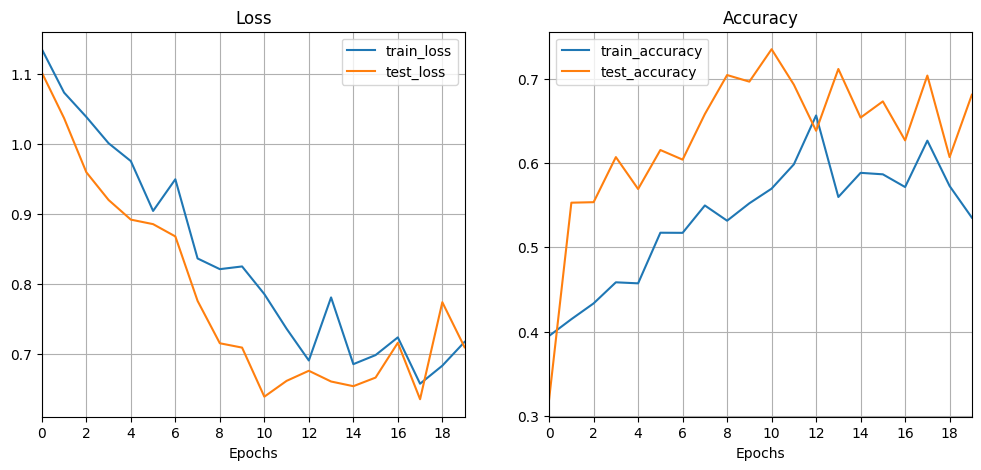

In [1038]:
plot_loss_curves(results[0])

Best test accuracy: 0.75%, hidden units: [40]


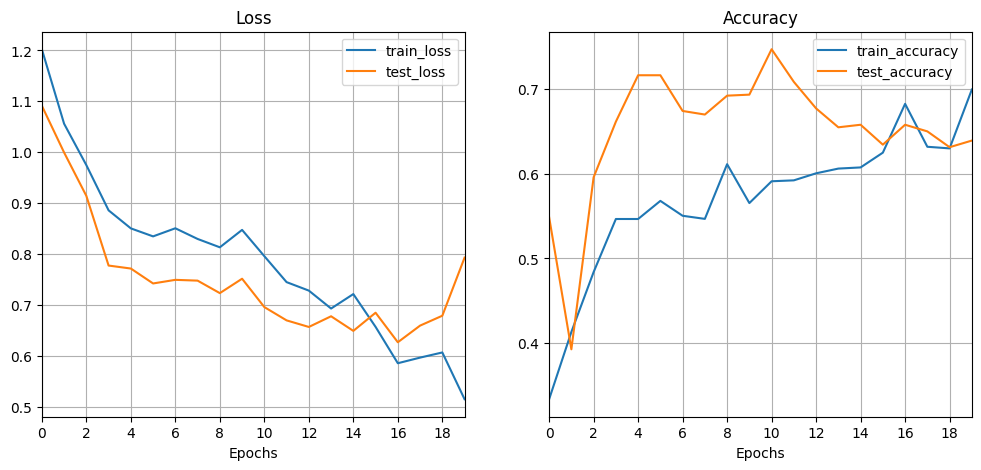

In [1040]:
plot_loss_curves(results[1])

Best test accuracy: 0.71%, hidden units: [58]


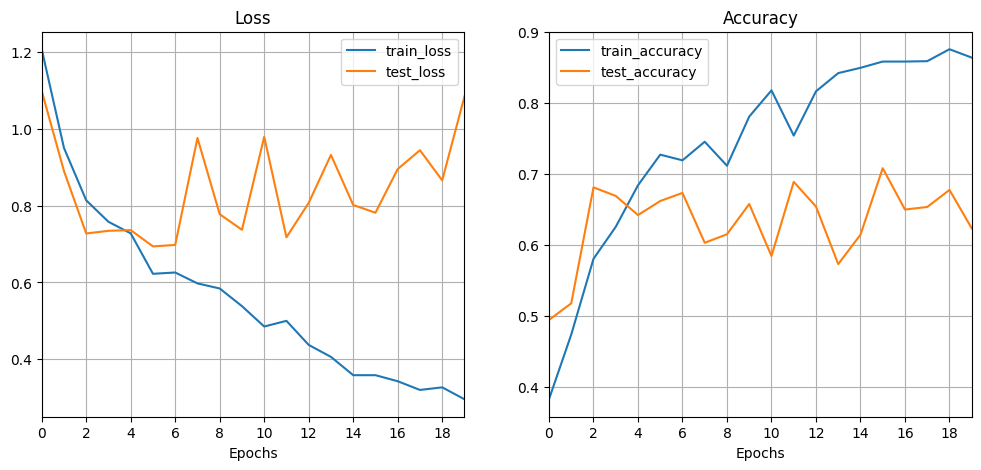

In [1042]:
plot_loss_curves(results[2])

Best test accuracy: 0.73%, hidden units: [80]


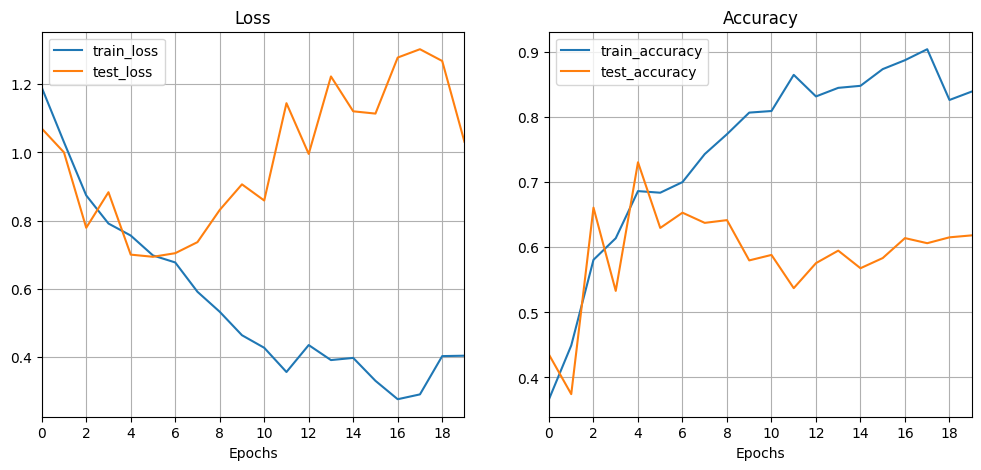

In [1047]:
plot_loss_curves(results[3])

#### Models with learning rate: 0.0001

Best test accuracy: 0.72%, hidden units: [20]


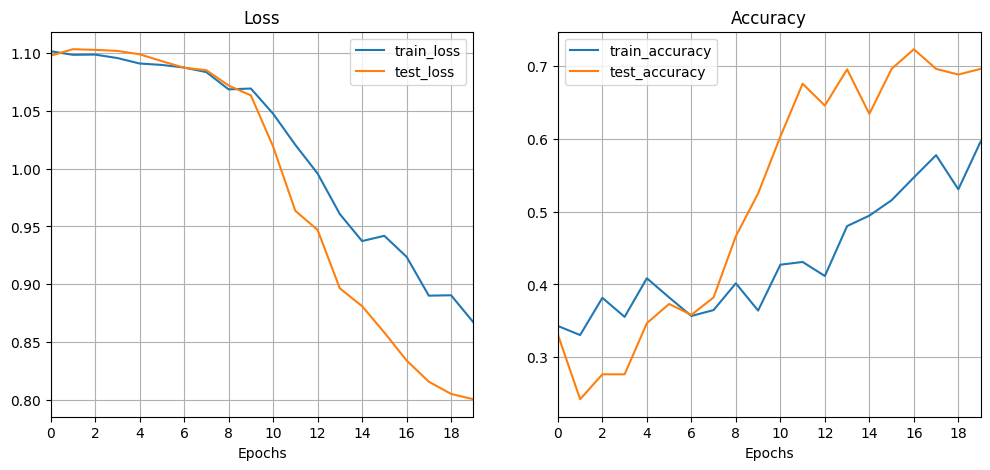

In [1049]:
plot_loss_curves(results[4])

Best test accuracy: 0.72%, hidden units: [40]


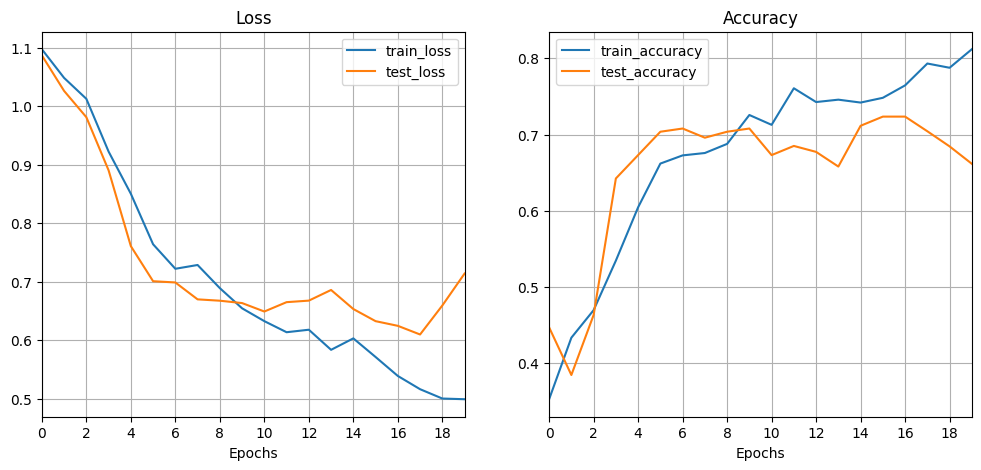

In [1053]:
plot_loss_curves(results[5])

Best test accuracy: 0.72%, hidden units: [58]


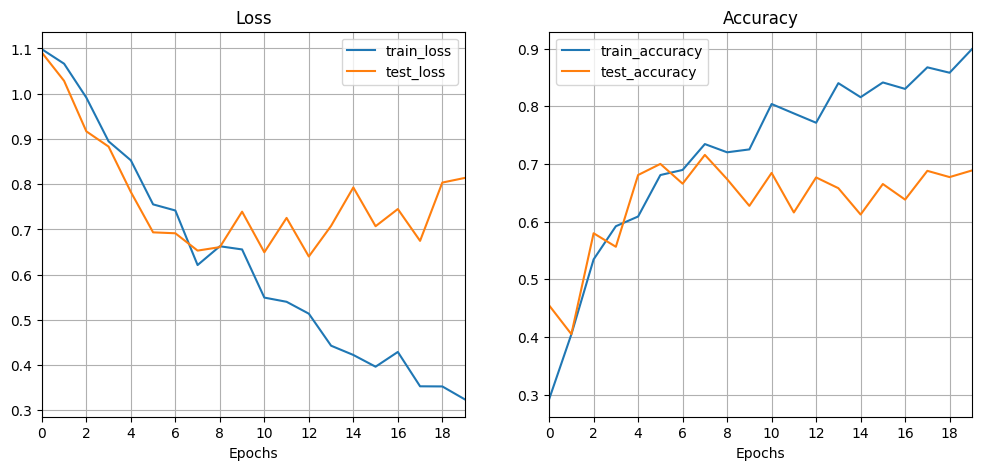

In [1059]:
plot_loss_curves(results[6])

Best test accuracy: 0.75%, hidden units: [80]


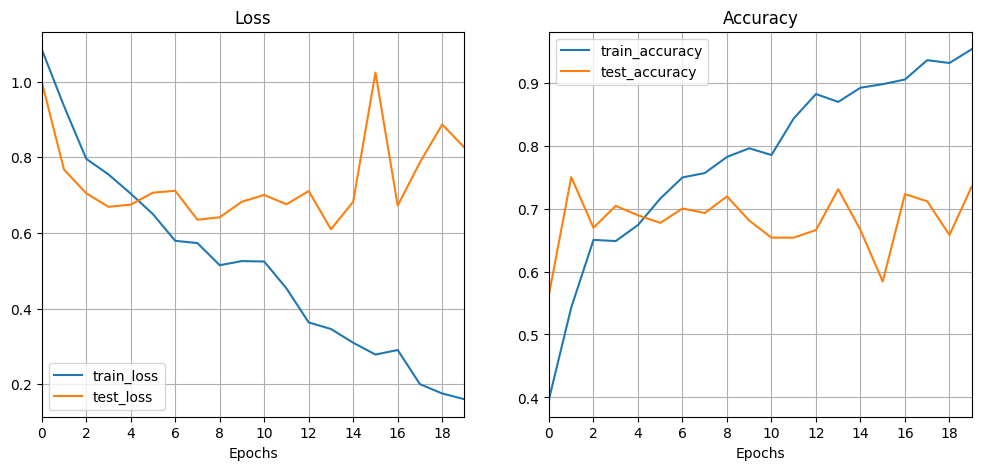

In [1058]:
plot_loss_curves(results[7])

Best test accuracy: 0.41%, hidden units: [20]


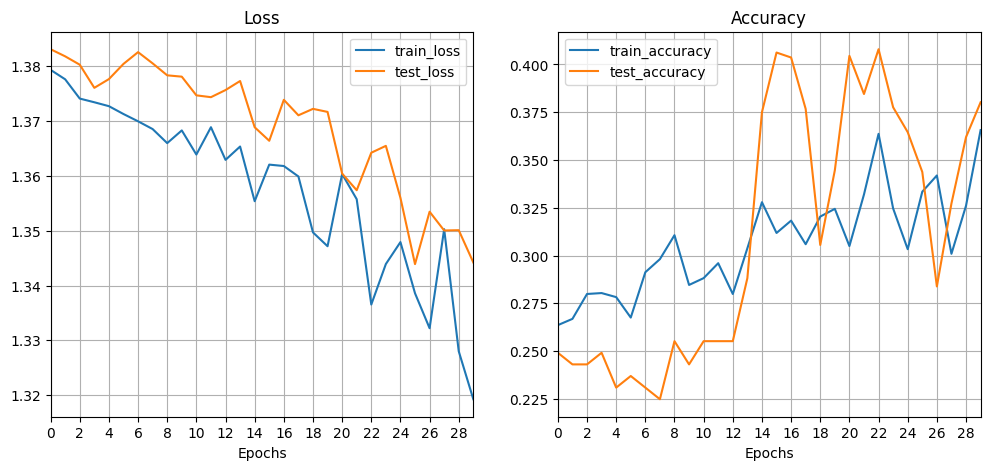

In [860]:
plot_loss_curves(results[10])

Best test accuracy: 0.44%, hidden units: [40]


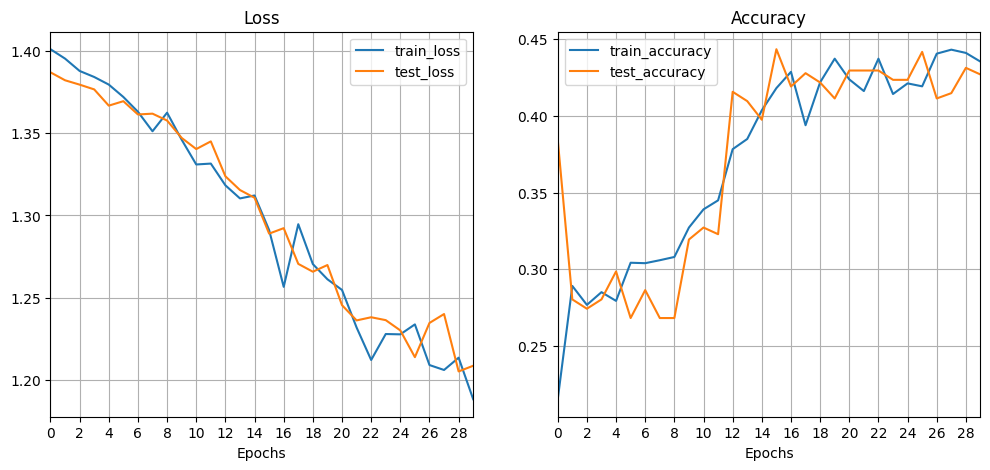

In [848]:
plot_loss_curves(results[11])

Best test accuracy: 0.53%, hidden units: [58]


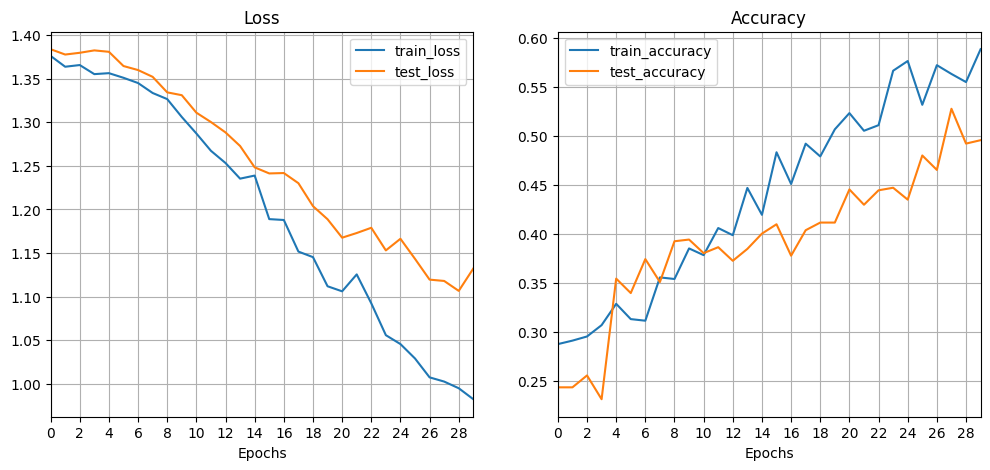

In [861]:
plot_loss_curves(results[12])

Best test accuracy: 0.59%, hidden units: [80]


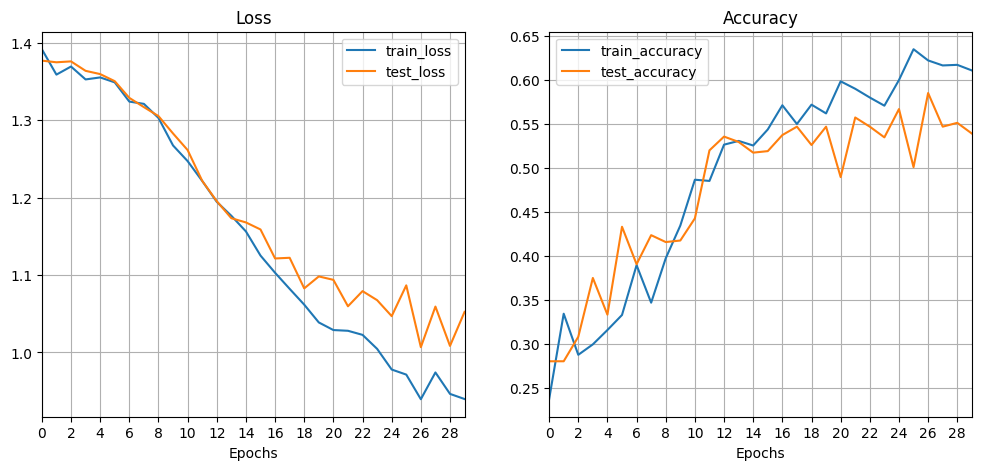

In [901]:
plot_loss_curves(results[13])

Best test accuracy: 0.59%, hidden units: [100]


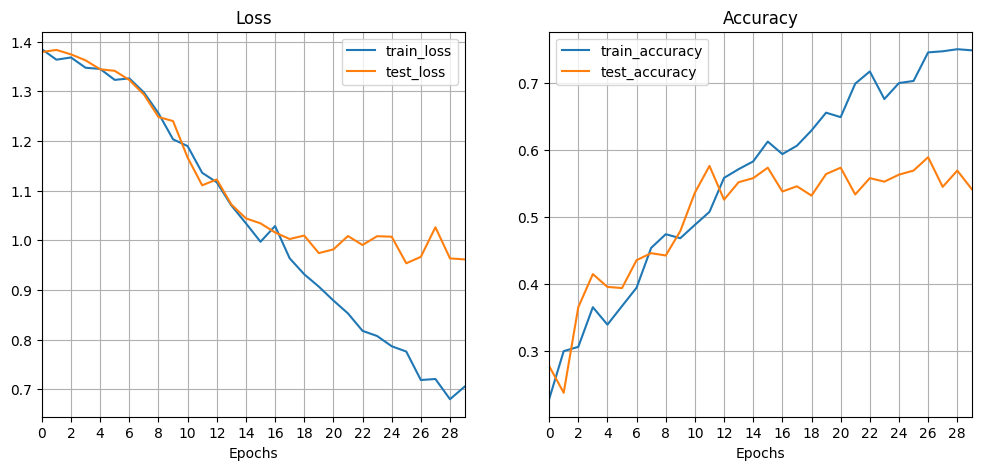

In [919]:
plot_loss_curves(results[14])

### Model V1

#### Models with learning rate: 0.001

Best test accuracy: 0.70%, hidden units: [20]


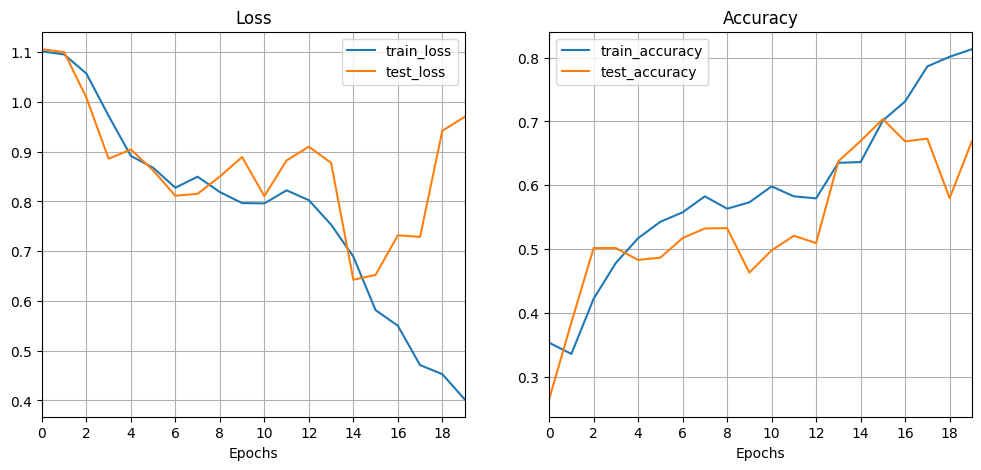

In [1061]:
plot_loss_curves(results_V1[0])

Best test accuracy: 0.73%, hidden units: [40]


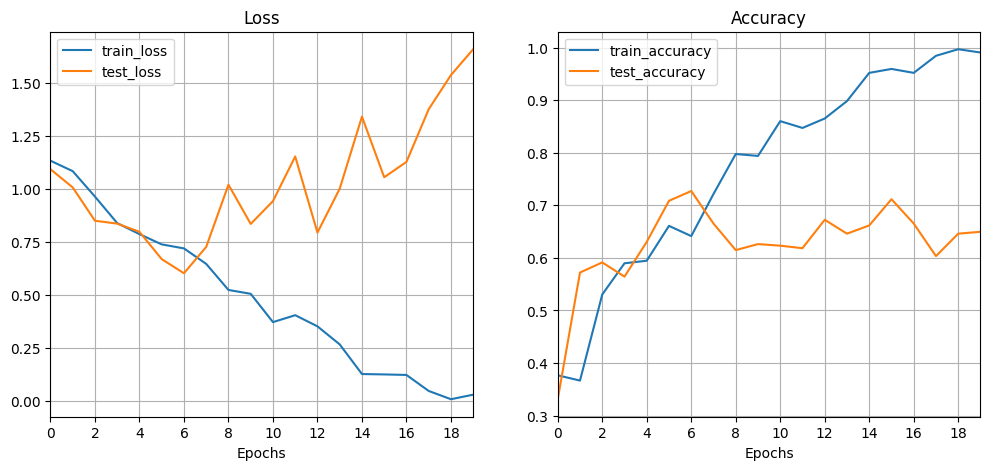

In [1063]:
plot_loss_curves(results_V1[1])

#### Models with learning rate: 0.0001

Best test accuracy: 0.72%, hidden units: [20]


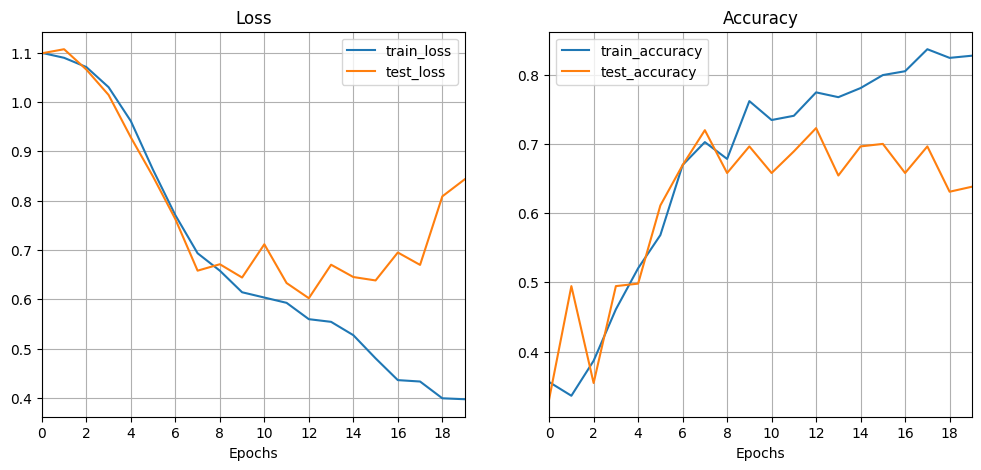

In [1065]:
plot_loss_curves(results_V1[2])

Best test accuracy: 0.75%, hidden units: [40]


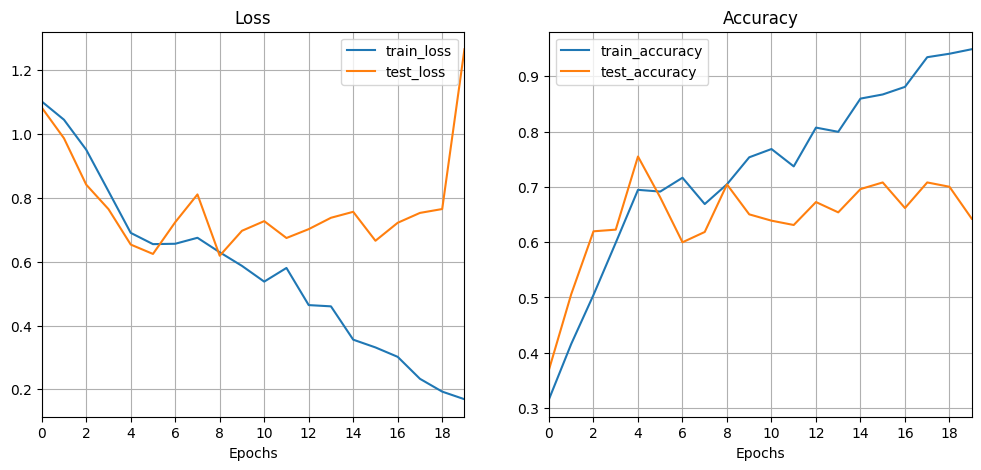

In [1067]:
plot_loss_curves(results_V1[3])

#### Models with learning rate: 0.00001

Best test accuracy: 0.57%, hidden units: [20]


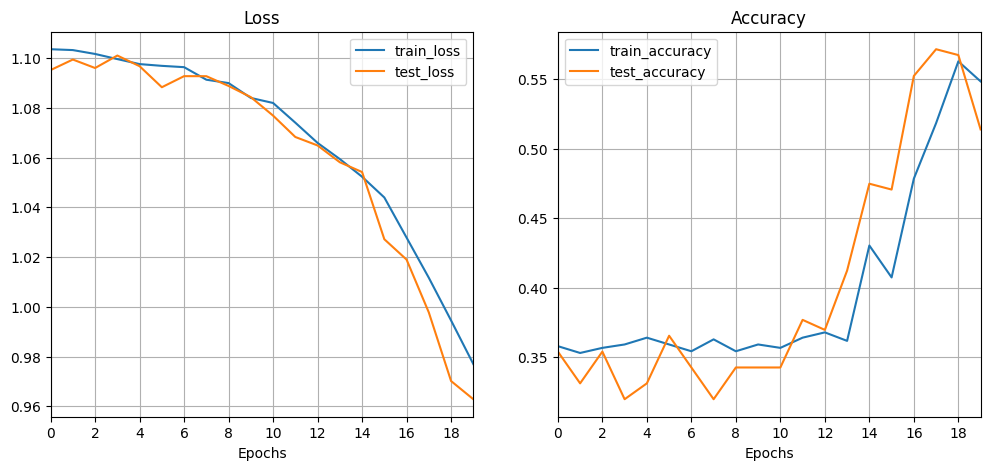

In [1069]:
plot_loss_curves(results_V1[4])

Best test accuracy: 0.75%, hidden units: [32]


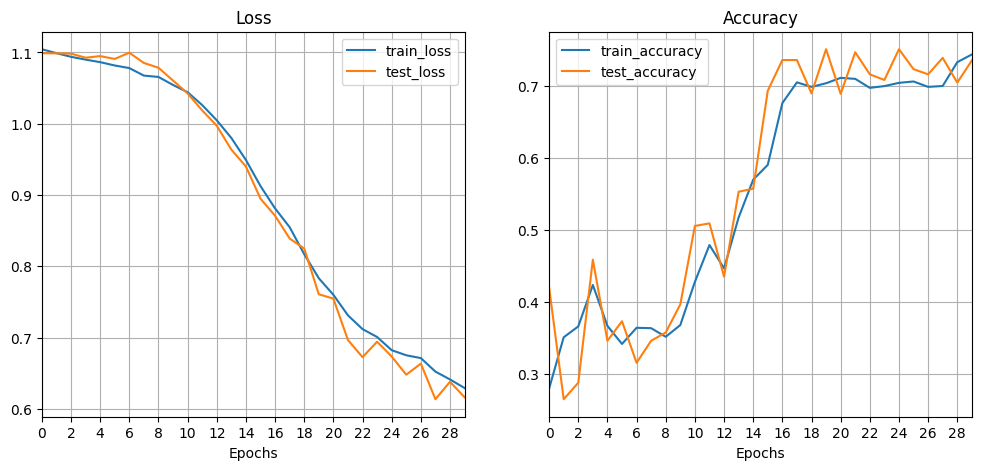

In [1071]:
plot_loss_curves(results_V1[5])

Best test accuracy: 0.73%, hidden units: [32]


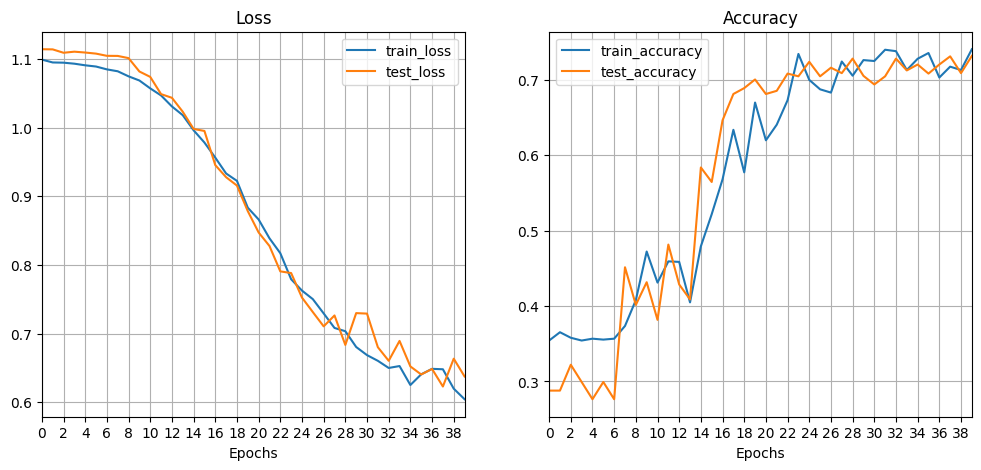

In [1075]:
plot_loss_curves(results_V1[7])

## Evaluating best models

#### Functions

In [942]:
# Function to evaluate the model by predicting random test images
def eval_model(num_images, test_data, model, class_names):
    assert num_images % 3 == 0

    n_rows = int(num_images / 3)
    n_cols = 3

    img_tensors = []
    img_labels = []

    # Gets n amount of random test images
    for i in range(num_images):
        idx = random.randint(0, len(test_data.dataset[:][0]))
        img_tensors.append(test_data.dataset[:][0][idx])
        img_labels.append(test_data.dataset[:][1][idx])
    
    # Makes predictions on the selected images
    for i in range(num_images): 
        logits = model(img_tensors[i].unsqueeze(dim=0))
        pred_probs = torch.softmax(logits, dim=1)
        pred_label = torch.argmax(pred_probs, dim=1)
        
        # Plot images
        img = img_tensors[i].permute(1, 2, 0)
        img_as_array = np.asarray(img)
        plt.subplot(n_rows, n_cols, i+1)
        plt.imshow(img_as_array)
        plt.axis(False)

        # Find prediction label
        pred_label = class_names[pred_label]

        # Find real label
        true_label = class_names[img_labels[i].item()]

        # Create a title for the plot
        title_text = f'Pred: {pred_label} | True: {true_label}'

        # Check for equality
        if pred_label == true_label:
            plt.title(title_text, fontsize=9, c='g')
        else:
            plt.title(title_text, fontsize=9, c='r')


# Function to generate a confusion matrix of the target model
def generate_confmat(model, data, class_names):
    y_preds = []

    model.eval()
    with torch.inference_mode():
        for X, y in data.dataset:
            logits = model(X.unsqueeze(dim=0))
            pred_probs = torch.softmax(logits, dim=1)
            pred_label = torch.argmax(pred_probs, dim=1)
            y_preds.append(pred_label)

    y_pred_tensor = torch.cat(y_preds)
    confmat = ConfusionMatrix(task='multiclass', num_classes=len(class_names))
    confmat_tensor = confmat(preds=y_pred_tensor,
                            target=data.dataset[:][1])

    return plot_confusion_matrix(
    conf_mat=confmat_tensor.numpy(),
    class_names=class_names,
    figsize=(10, 7))

#### model 7

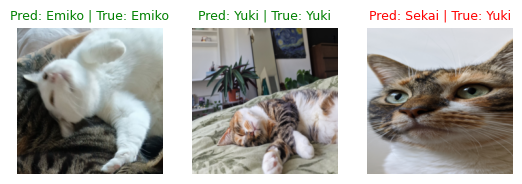

In [1084]:
eval_model(3, test_dataloader, model_7, class_names)

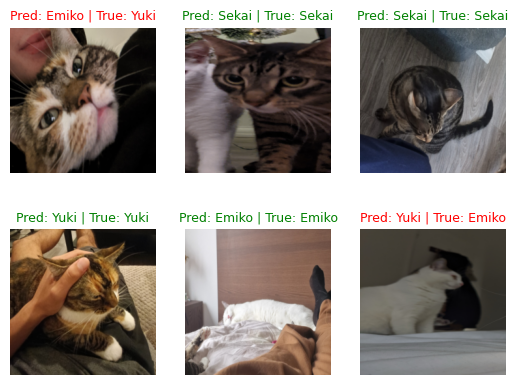

In [1085]:
eval_model(6, test_dataloader, model_7, class_names)

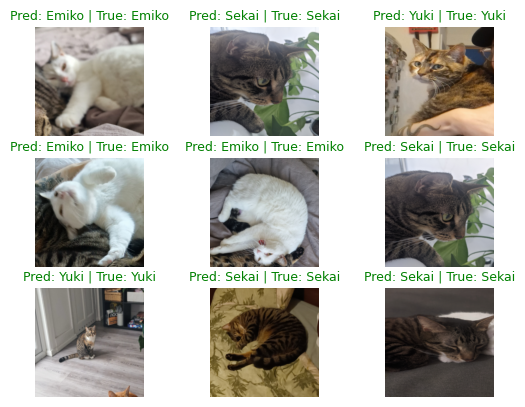

In [1086]:
eval_model(9, test_dataloader, model_7, class_names)

(<Figure size 1000x700 with 1 Axes>,
 <Axes: xlabel='predicted label', ylabel='true label'>)

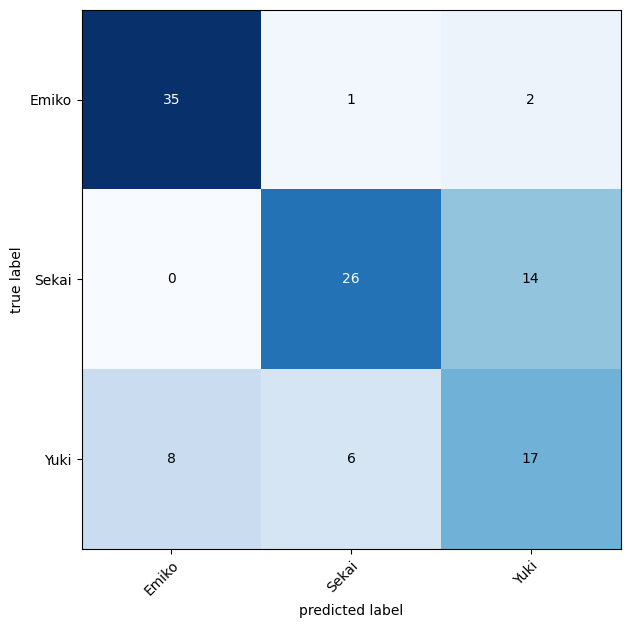

In [1087]:
generate_confmat(model_7, test_dataloader, class_names)

#### Model 5_V1

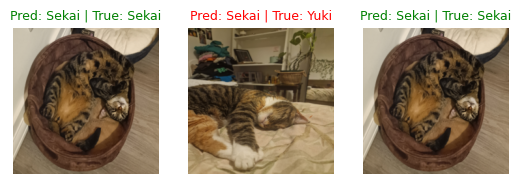

In [1088]:
eval_model(3, test_dataloader, V1_model_5, class_names)

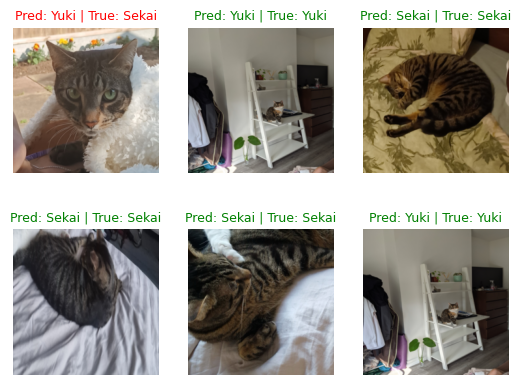

In [1089]:
eval_model(6, test_dataloader, V1_model_5, class_names)

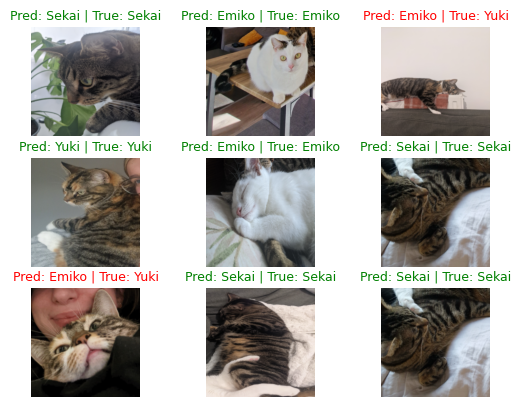

In [1090]:
eval_model(9, test_dataloader, V1_model_5, class_names)

(<Figure size 1000x700 with 1 Axes>,
 <Axes: xlabel='predicted label', ylabel='true label'>)

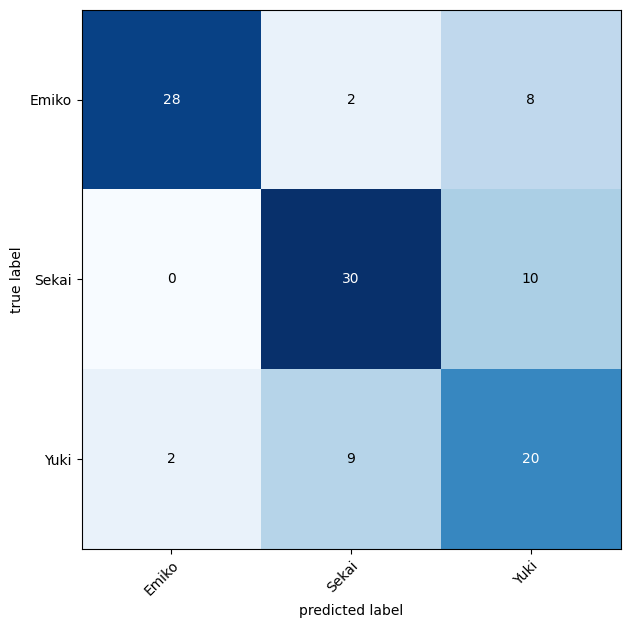

In [1091]:
generate_confmat(V1_model_5, test_dataloader, class_names)

# Using a pre-trained model

## Setup

#### Functions

In [971]:
def plot_tl_loss_curves(results):
    print(f'Best test accuracy: {max(results['test_acc']):.2f}%')
    loss = results['train_loss']
    test_loss = results['test_loss']

    train_accuracy = results['train_acc']
    test_accuracy = results['test_acc']

    epochs = range(len(results['train_loss']))

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    listOf_Xticks = np.arange(0, len(results['test_loss']), 2)
    plt.xticks(listOf_Xticks)
    plt.xlim(0, (len(results['test_loss']) - 1))
    plt.grid(True)
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.xticks(listOf_Xticks)
    plt.xlim(0, (len(results['test_loss']) - 1))
    plt.grid(True)
    plt.legend()


def train_tl_model(lr, epochs: int, train_dataset, test_dataset, classes, results, weights, classifier=None):  
    res = {'learning_rate': [],
            'train_loss': [],
            'train_acc': [],
            'test_loss': [],
            'test_acc': []}
    # Create model with existing weights
    model = torchvision.models.efficientnet_b0(weights=weights)
    # Freeze trained weights
    for param in model.features.parameters():
        param.requires_grad = False
    # Correct the classifier section
    output_shape = len(classes)
    # Recreate the classifier layer
    if classifier:
        model.classifier = classifier
    else:
        model.classifier = torch.nn.Sequential(
            torch.nn.Dropout(p=0.2, inplace=True), 
            torch.nn.Linear(in_features=1280, 
                            out_features=output_shape,
                            bias=True))    
    
    loss_fn = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    for epoch in range(epochs):
        train_loss, train_acc = train_step(model, train_dataset, loss_fn, optimizer)
        test_loss, test_acc = test_step(model, test_dataset, loss_fn)
        print(f'Epoch: {epoch} | Train loss: {train_loss:.4f}, Train acc: {train_acc:.2f}% | \
Test loss: {test_loss:.4f}, Test acc: {test_acc:.2f}%')
        res['train_loss'].append(train_loss)
        res['train_acc'].append(train_acc)
        res['test_loss'].append(test_loss)
        res['test_acc'].append(test_acc)
    res['learning_rate'].append(lr)
    results.append(res)

    return model

#### Getting the model weights

In [1092]:
# Get a set of pretrained model weights
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights from pretraining on ImageNet

In [952]:
# Get the transforms used to create our pretrained weights
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [ ]:
pt_model = torchvision.models.efficientnet_b0(weights=weights)

In [954]:
architecture = summary(model=pt_model, 
        input_size=(32, 3, 224, 224), 
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)    

# Uncomment to see the results
# architecture

In [955]:
# Freeze all base layers in the "features" section of the model (the feature extractor) by setting requires_grad=False
for param in pt_model.features.parameters():
    param.requires_grad = False

In [956]:
# Get the length of class_names (one output unit for each class)
output_shape = len(class_names)

# Recreate the classifier layer and seed it to the target device
pt_model.classifier = torch.nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True), 
    torch.nn.Linear(in_features=1280, 
                    out_features=output_shape, # Same number of output units as our number of classes
                    bias=True))

In [957]:
# Do a summary *after* freezing the features and changing the output classifier layer
architecture = summary(pt_model, 
        input_size=(32, 3, 224, 224),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

## Models 

In [1093]:
# Initialise empty list to store accuracy and loss of all the next models
transfer_learning_model_results = []

In [1107]:
# Generate two new different classifiers
new_classifier = torch.nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True), 
    torch.nn.Linear(in_features=1280, 
                    out_features=640,
                    bias=True),
    torch.nn.ReLU(),
    torch.nn.Linear(in_features=640, 
                    out_features=output_shape,
                    bias=True))

new_classifier_V1 = torch.nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True), 
    torch.nn.Linear(in_features=1280, 
                    out_features=1280,
                    bias=True),
    torch.nn.ReLU(),
    torch.nn.Linear(in_features=1280, 
                    out_features=640,
                    bias=True),
    torch.nn.ReLU(),
    torch.nn.Linear(in_features=640, 
                    out_features=output_shape,
                    bias=True))

#### Learning rate: 0.001

##### Standard classifier

In [1094]:
pt_model_0 = train_tl_model(0.001, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights)

Epoch: 0 | Train loss: 0.9537, Train acc: 0.60% | Test loss: 0.8881, Test acc: 0.68%
Epoch: 1 | Train loss: 0.6727, Train acc: 0.85% | Test loss: 0.7508, Test acc: 0.68%
Epoch: 2 | Train loss: 0.5180, Train acc: 0.91% | Test loss: 0.5663, Test acc: 0.83%
Epoch: 3 | Train loss: 0.3961, Train acc: 0.95% | Test loss: 0.5296, Test acc: 0.79%
Epoch: 4 | Train loss: 0.3660, Train acc: 0.94% | Test loss: 0.5435, Test acc: 0.78%
Epoch: 5 | Train loss: 0.3007, Train acc: 0.95% | Test loss: 0.5095, Test acc: 0.81%
Epoch: 6 | Train loss: 0.2558, Train acc: 0.97% | Test loss: 0.5117, Test acc: 0.79%
Epoch: 7 | Train loss: 0.2171, Train acc: 0.97% | Test loss: 0.4544, Test acc: 0.82%
Epoch: 8 | Train loss: 0.2077, Train acc: 0.98% | Test loss: 0.5189, Test acc: 0.77%
Epoch: 9 | Train loss: 0.1987, Train acc: 0.97% | Test loss: 0.5108, Test acc: 0.79%
Epoch: 10 | Train loss: 0.1532, Train acc: 0.99% | Test loss: 0.5018, Test acc: 0.76%
Epoch: 11 | Train loss: 0.1603, Train acc: 0.98% | Test loss: 0.

##### Next classifier

In [1097]:
pt_model_1 = train_tl_model(0.001, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier)

Epoch: 0 | Train loss: 0.7578, Train acc: 0.70% | Test loss: 0.6700, Test acc: 0.74%
Epoch: 1 | Train loss: 0.1903, Train acc: 0.95% | Test loss: 0.6463, Test acc: 0.74%
Epoch: 2 | Train loss: 0.0998, Train acc: 0.98% | Test loss: 0.4257, Test acc: 0.87%
Epoch: 3 | Train loss: 0.0683, Train acc: 0.97% | Test loss: 0.3195, Test acc: 0.88%
Epoch: 4 | Train loss: 0.0431, Train acc: 0.99% | Test loss: 0.3336, Test acc: 0.87%
Epoch: 5 | Train loss: 0.0278, Train acc: 1.00% | Test loss: 0.4608, Test acc: 0.86%
Epoch: 6 | Train loss: 0.0303, Train acc: 0.99% | Test loss: 0.5578, Test acc: 0.88%
Epoch: 7 | Train loss: 0.0232, Train acc: 1.00% | Test loss: 0.6165, Test acc: 0.79%
Epoch: 8 | Train loss: 0.0248, Train acc: 0.99% | Test loss: 0.4562, Test acc: 0.85%
Epoch: 9 | Train loss: 0.0270, Train acc: 0.99% | Test loss: 0.7118, Test acc: 0.82%
Epoch: 10 | Train loss: 0.0223, Train acc: 0.99% | Test loss: 0.4661, Test acc: 0.86%
Epoch: 11 | Train loss: 0.0087, Train acc: 1.00% | Test loss: 0.

#### Learning rate: 0.0001

##### Standard classifier

In [1099]:
pt_model_2 = train_tl_model(0.0001, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights)

Epoch: 0 | Train loss: 1.1071, Train acc: 0.34% | Test loss: 1.0371, Test acc: 0.49%
Epoch: 1 | Train loss: 1.0628, Train acc: 0.45% | Test loss: 1.0316, Test acc: 0.50%
Epoch: 2 | Train loss: 1.0178, Train acc: 0.56% | Test loss: 1.0077, Test acc: 0.60%
Epoch: 3 | Train loss: 0.9895, Train acc: 0.61% | Test loss: 0.9883, Test acc: 0.58%
Epoch: 4 | Train loss: 0.9483, Train acc: 0.69% | Test loss: 0.9735, Test acc: 0.61%
Epoch: 5 | Train loss: 0.9194, Train acc: 0.72% | Test loss: 0.9616, Test acc: 0.57%
Epoch: 6 | Train loss: 0.8749, Train acc: 0.79% | Test loss: 0.9604, Test acc: 0.56%
Epoch: 7 | Train loss: 0.8633, Train acc: 0.77% | Test loss: 0.9308, Test acc: 0.60%
Epoch: 8 | Train loss: 0.8286, Train acc: 0.82% | Test loss: 0.9247, Test acc: 0.63%
Epoch: 9 | Train loss: 0.8056, Train acc: 0.83% | Test loss: 0.8982, Test acc: 0.63%
Epoch: 10 | Train loss: 0.7739, Train acc: 0.86% | Test loss: 0.8701, Test acc: 0.70%
Epoch: 11 | Train loss: 0.7651, Train acc: 0.86% | Test loss: 0.

In [1115]:
pt_model_6 = train_tl_model(0.0005, 
                            20, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights)

Epoch: 0 | Train loss: 1.0536, Train acc: 0.48% | Test loss: 1.0490, Test acc: 0.46%
Epoch: 1 | Train loss: 0.8691, Train acc: 0.72% | Test loss: 0.9137, Test acc: 0.66%
Epoch: 2 | Train loss: 0.7566, Train acc: 0.80% | Test loss: 0.8243, Test acc: 0.68%
Epoch: 3 | Train loss: 0.6444, Train acc: 0.89% | Test loss: 0.7782, Test acc: 0.77%
Epoch: 4 | Train loss: 0.5771, Train acc: 0.92% | Test loss: 0.7017, Test acc: 0.79%
Epoch: 5 | Train loss: 0.4961, Train acc: 0.93% | Test loss: 0.6819, Test acc: 0.79%
Epoch: 6 | Train loss: 0.4324, Train acc: 0.96% | Test loss: 0.6904, Test acc: 0.72%
Epoch: 7 | Train loss: 0.4205, Train acc: 0.94% | Test loss: 0.6227, Test acc: 0.76%
Epoch: 8 | Train loss: 0.3726, Train acc: 0.96% | Test loss: 0.6399, Test acc: 0.76%
Epoch: 9 | Train loss: 0.3488, Train acc: 0.97% | Test loss: 0.6517, Test acc: 0.73%
Epoch: 10 | Train loss: 0.3112, Train acc: 0.97% | Test loss: 0.5989, Test acc: 0.78%
Epoch: 11 | Train loss: 0.2938, Train acc: 0.98% | Test loss: 0.

##### Next classifier

In [1100]:
pt_model_3 = train_tl_model(0.0001, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier)

Epoch: 0 | Train loss: 0.0099, Train acc: 1.00% | Test loss: 1.0374, Test acc: 0.72%
Epoch: 1 | Train loss: 0.0026, Train acc: 1.00% | Test loss: 0.9051, Test acc: 0.79%
Epoch: 2 | Train loss: 0.0230, Train acc: 0.99% | Test loss: 0.5649, Test acc: 0.84%
Epoch: 3 | Train loss: 0.0093, Train acc: 1.00% | Test loss: 0.5620, Test acc: 0.86%
Epoch: 4 | Train loss: 0.0030, Train acc: 1.00% | Test loss: 0.5233, Test acc: 0.85%
Epoch: 5 | Train loss: 0.0022, Train acc: 1.00% | Test loss: 0.5691, Test acc: 0.88%
Epoch: 6 | Train loss: 0.0059, Train acc: 1.00% | Test loss: 0.6045, Test acc: 0.89%
Epoch: 7 | Train loss: 0.0016, Train acc: 1.00% | Test loss: 0.5161, Test acc: 0.89%
Epoch: 8 | Train loss: 0.0130, Train acc: 0.99% | Test loss: 0.5885, Test acc: 0.86%
Epoch: 9 | Train loss: 0.0036, Train acc: 1.00% | Test loss: 0.5480, Test acc: 0.88%
Epoch: 10 | Train loss: 0.0035, Train acc: 1.00% | Test loss: 0.6768, Test acc: 0.87%
Epoch: 11 | Train loss: 0.0018, Train acc: 1.00% | Test loss: 0.

In [1104]:
pt_model_4 = train_tl_model(0.00005, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier)

Epoch: 0 | Train loss: 0.0013, Train acc: 1.00% | Test loss: 1.1089, Test acc: 0.77%
Epoch: 1 | Train loss: 0.0074, Train acc: 0.99% | Test loss: 0.9670, Test acc: 0.78%
Epoch: 2 | Train loss: 0.0040, Train acc: 1.00% | Test loss: 0.6569, Test acc: 0.85%
Epoch: 3 | Train loss: 0.0013, Train acc: 1.00% | Test loss: 0.5550, Test acc: 0.89%
Epoch: 4 | Train loss: 0.0010, Train acc: 1.00% | Test loss: 0.5890, Test acc: 0.86%
Epoch: 5 | Train loss: 0.0010, Train acc: 1.00% | Test loss: 0.5872, Test acc: 0.88%
Epoch: 6 | Train loss: 0.0021, Train acc: 1.00% | Test loss: 0.6298, Test acc: 0.89%
Epoch: 7 | Train loss: 0.0018, Train acc: 1.00% | Test loss: 0.7392, Test acc: 0.86%
Epoch: 8 | Train loss: 0.0007, Train acc: 1.00% | Test loss: 0.5708, Test acc: 0.90%
Epoch: 9 | Train loss: 0.0018, Train acc: 1.00% | Test loss: 0.6197, Test acc: 0.89%
Epoch: 10 | Train loss: 0.0008, Train acc: 1.00% | Test loss: 0.6540, Test acc: 0.86%
Epoch: 11 | Train loss: 0.0090, Train acc: 1.00% | Test loss: 0.

In [1108]:
pt_model_5 = train_tl_model(0.00005, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier_V1)

Epoch: 0 | Train loss: 1.3336, Train acc: 0.52% | Test loss: 1.2896, Test acc: 0.53%
Epoch: 1 | Train loss: 1.2024, Train acc: 0.74% | Test loss: 1.1866, Test acc: 0.58%
Epoch: 2 | Train loss: 1.0747, Train acc: 0.71% | Test loss: 1.0781, Test acc: 0.58%
Epoch: 3 | Train loss: 0.9372, Train acc: 0.69% | Test loss: 0.9758, Test acc: 0.56%
Epoch: 4 | Train loss: 0.7977, Train acc: 0.80% | Test loss: 0.8613, Test acc: 0.65%
Epoch: 5 | Train loss: 0.6525, Train acc: 0.93% | Test loss: 0.7562, Test acc: 0.67%
Epoch: 6 | Train loss: 0.5226, Train acc: 0.94% | Test loss: 0.6305, Test acc: 0.82%
Epoch: 7 | Train loss: 0.3967, Train acc: 0.95% | Test loss: 0.5569, Test acc: 0.84%
Epoch: 8 | Train loss: 0.3348, Train acc: 0.95% | Test loss: 0.5446, Test acc: 0.82%
Epoch: 9 | Train loss: 0.2555, Train acc: 0.98% | Test loss: 0.4879, Test acc: 0.83%
Epoch: 10 | Train loss: 0.2150, Train acc: 0.97% | Test loss: 0.5039, Test acc: 0.80%
Epoch: 11 | Train loss: 0.1720, Train acc: 0.98% | Test loss: 0.

In [1116]:
pt_model_7 = train_tl_model(0.0005, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier)

Epoch: 0 | Train loss: 0.9681, Train acc: 0.68% | Test loss: 0.8008, Test acc: 0.72%
Epoch: 1 | Train loss: 0.4136, Train acc: 0.95% | Test loss: 0.5503, Test acc: 0.77%
Epoch: 2 | Train loss: 0.1998, Train acc: 0.96% | Test loss: 0.3755, Test acc: 0.85%
Epoch: 3 | Train loss: 0.1379, Train acc: 0.97% | Test loss: 0.3743, Test acc: 0.84%
Epoch: 4 | Train loss: 0.0969, Train acc: 0.98% | Test loss: 0.3775, Test acc: 0.80%
Epoch: 5 | Train loss: 0.0728, Train acc: 0.98% | Test loss: 0.4254, Test acc: 0.79%
Epoch: 6 | Train loss: 0.0567, Train acc: 0.98% | Test loss: 0.4776, Test acc: 0.82%
Epoch: 7 | Train loss: 0.0559, Train acc: 0.99% | Test loss: 0.3785, Test acc: 0.82%
Epoch: 8 | Train loss: 0.0516, Train acc: 0.98% | Test loss: 0.5029, Test acc: 0.77%
Epoch: 9 | Train loss: 0.0334, Train acc: 1.00% | Test loss: 0.4739, Test acc: 0.84%
Epoch: 10 | Train loss: 0.0233, Train acc: 1.00% | Test loss: 0.4542, Test acc: 0.86%
Epoch: 11 | Train loss: 0.0179, Train acc: 1.00% | Test loss: 0.

In [1117]:
pt_model_8 = train_tl_model(0.0005, 
                            30, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier_V1)

Epoch: 0 | Train loss: 0.2129, Train acc: 0.94% | Test loss: 0.7588, Test acc: 0.81%
Epoch: 1 | Train loss: 0.2180, Train acc: 0.92% | Test loss: 1.0281, Test acc: 0.74%
Epoch: 2 | Train loss: 0.1480, Train acc: 0.95% | Test loss: 0.5013, Test acc: 0.85%
Epoch: 3 | Train loss: 0.0601, Train acc: 0.98% | Test loss: 0.3356, Test acc: 0.91%
Epoch: 4 | Train loss: 0.0732, Train acc: 0.97% | Test loss: 0.4556, Test acc: 0.89%
Epoch: 5 | Train loss: 0.0175, Train acc: 0.99% | Test loss: 0.7715, Test acc: 0.80%
Epoch: 6 | Train loss: 0.0100, Train acc: 1.00% | Test loss: 0.6652, Test acc: 0.81%
Epoch: 7 | Train loss: 0.0170, Train acc: 0.99% | Test loss: 0.6930, Test acc: 0.83%
Epoch: 8 | Train loss: 0.0074, Train acc: 1.00% | Test loss: 0.4678, Test acc: 0.88%
Epoch: 9 | Train loss: 0.0108, Train acc: 1.00% | Test loss: 0.7082, Test acc: 0.79%
Epoch: 10 | Train loss: 0.0085, Train acc: 1.00% | Test loss: 0.5798, Test acc: 0.84%
Epoch: 11 | Train loss: 0.0037, Train acc: 1.00% | Test loss: 0.

In [1122]:
pt_model_9 = train_tl_model(0.0005, 
                            4, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier_V1)

Epoch: 0 | Train loss: 0.0016, Train acc: 1.00% | Test loss: 2.0867, Test acc: 0.73%
Epoch: 1 | Train loss: 0.0046, Train acc: 1.00% | Test loss: 1.2330, Test acc: 0.77%
Epoch: 2 | Train loss: 0.0204, Train acc: 0.99% | Test loss: 1.1370, Test acc: 0.83%
Epoch: 3 | Train loss: 0.0376, Train acc: 0.99% | Test loss: 1.0708, Test acc: 0.88%


In [1124]:
pt_model_10 = train_tl_model(0.0005, 
                            8, 
                            train_dataloader, 
                            test_dataloader, 
                            class_names, 
                            transfer_learning_model_results, 
                            weights,
                            new_classifier_V1)

Epoch: 0 | Train loss: 0.0011, Train acc: 1.00% | Test loss: 2.5996, Test acc: 0.75%
Epoch: 1 | Train loss: 0.0027, Train acc: 1.00% | Test loss: 1.3797, Test acc: 0.85%
Epoch: 2 | Train loss: 0.0513, Train acc: 0.99% | Test loss: 1.0484, Test acc: 0.86%
Epoch: 3 | Train loss: 0.0513, Train acc: 0.99% | Test loss: 0.8878, Test acc: 0.83%
Epoch: 4 | Train loss: 0.1396, Train acc: 0.97% | Test loss: 1.7341, Test acc: 0.75%
Epoch: 5 | Train loss: 0.0711, Train acc: 0.98% | Test loss: 0.4931, Test acc: 0.86%
Epoch: 6 | Train loss: 0.0752, Train acc: 0.98% | Test loss: 0.4393, Test acc: 0.91%
Epoch: 7 | Train loss: 0.0109, Train acc: 0.99% | Test loss: 0.5787, Test acc: 0.89%


## Visualsing loss and accuracy

#### Learning rate: 0.001

Best test accuracy: 0.83%


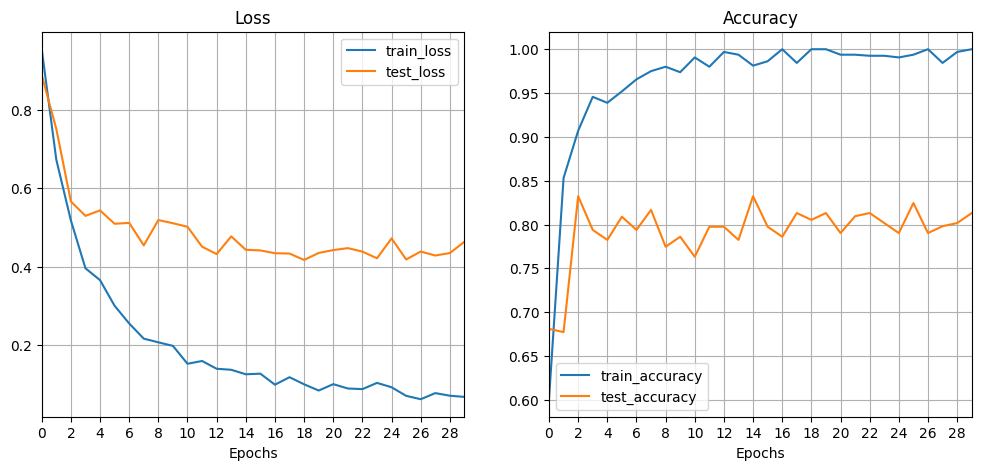

In [1095]:
plot_tl_loss_curves(transfer_learning_model_results[0])

Best test accuracy: 0.88%


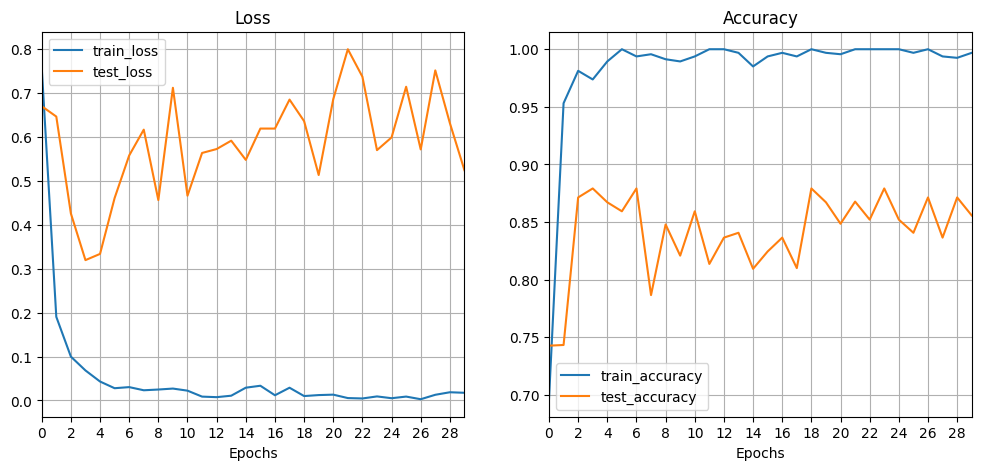

In [1098]:
plot_tl_loss_curves(transfer_learning_model_results[1])

#### Learning rate: 0.0001

Best test accuracy: 0.83%


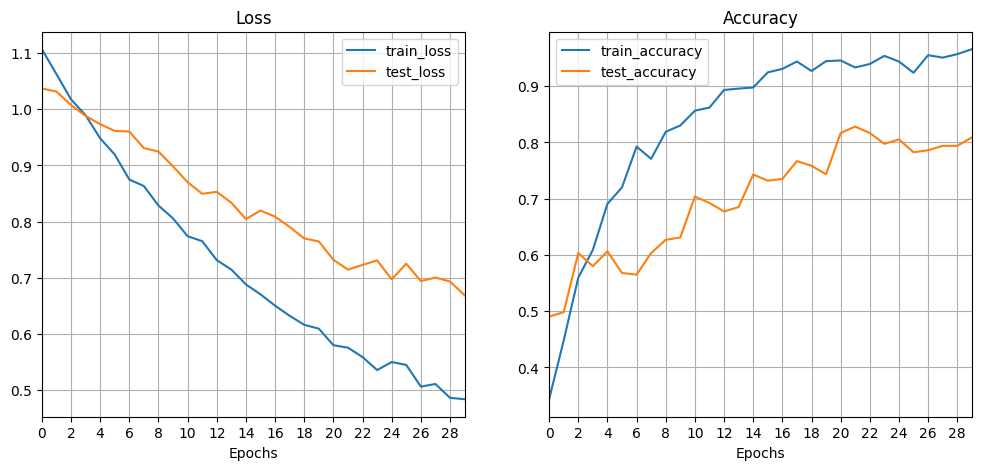

In [1101]:
plot_tl_loss_curves(transfer_learning_model_results[2])

Best test accuracy: 0.89%


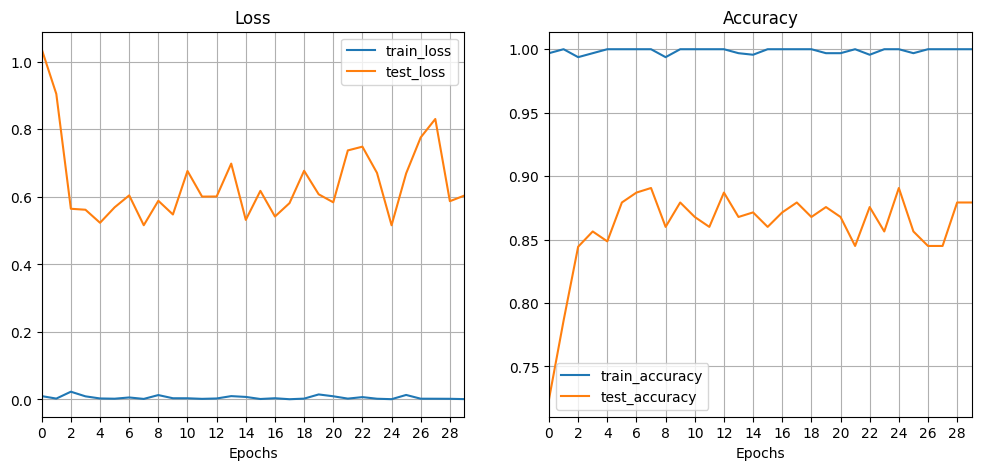

In [1102]:
plot_tl_loss_curves(transfer_learning_model_results[3])

Best test accuracy: 0.90%


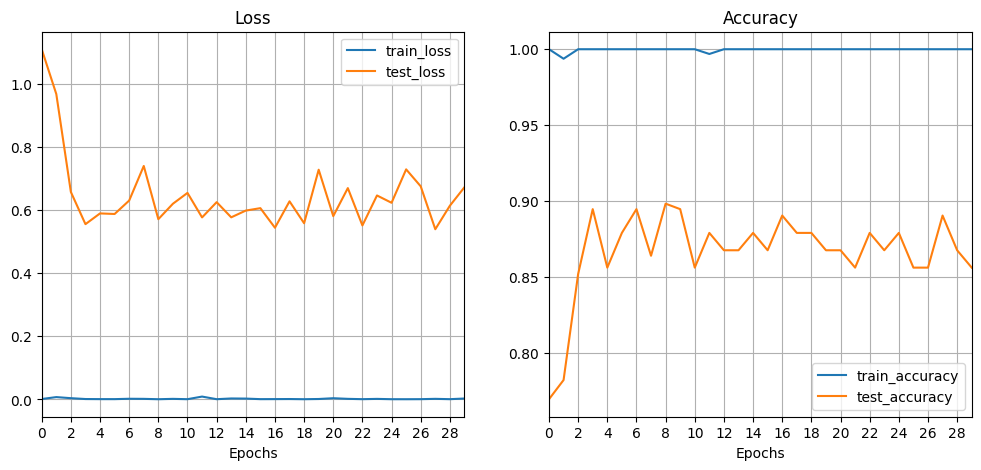

In [1105]:
plot_tl_loss_curves(transfer_learning_model_results[4])

Best test accuracy: 0.86%


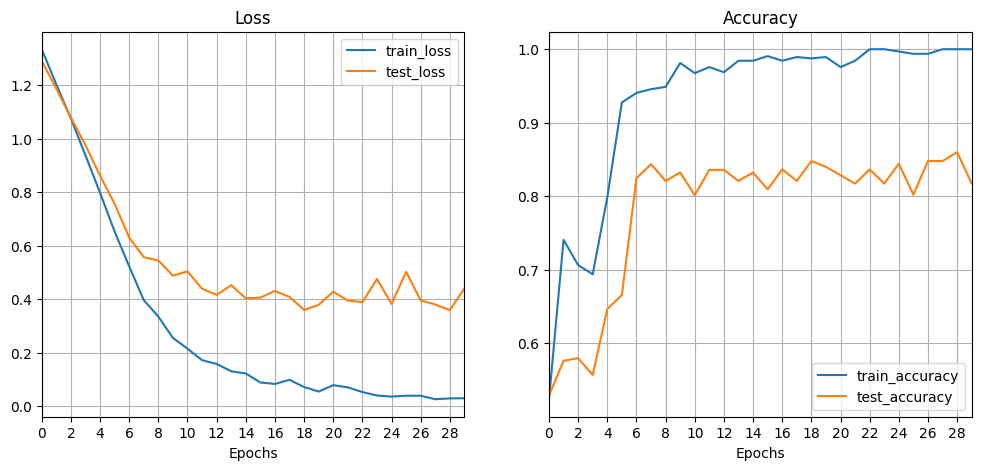

In [1109]:
plot_tl_loss_curves(transfer_learning_model_results[5])

Best test accuracy: 0.82%


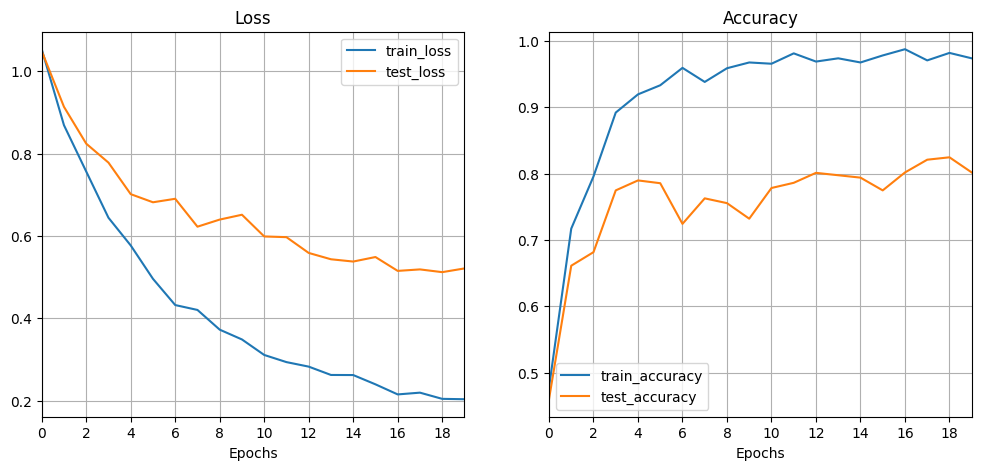

In [1118]:
plot_tl_loss_curves(transfer_learning_model_results[6])

Best test accuracy: 0.88%


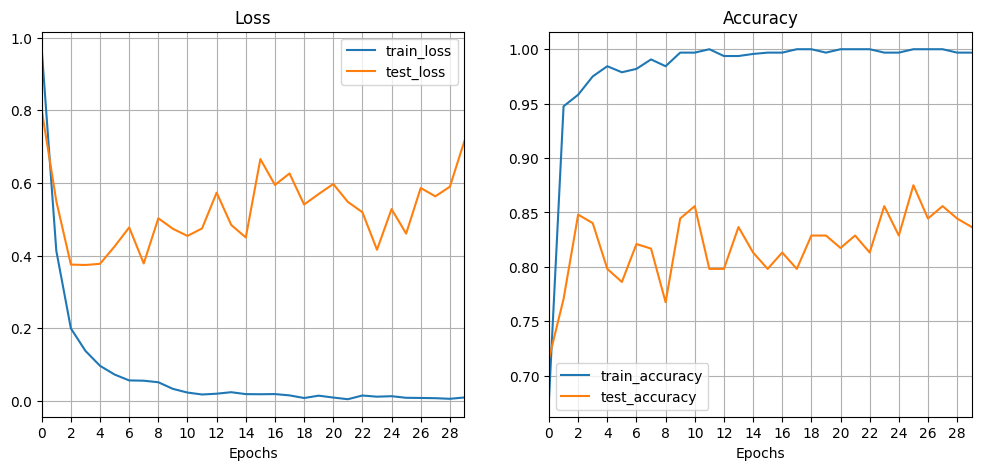

In [1119]:
plot_tl_loss_curves(transfer_learning_model_results[7])

Best test accuracy: 0.91%


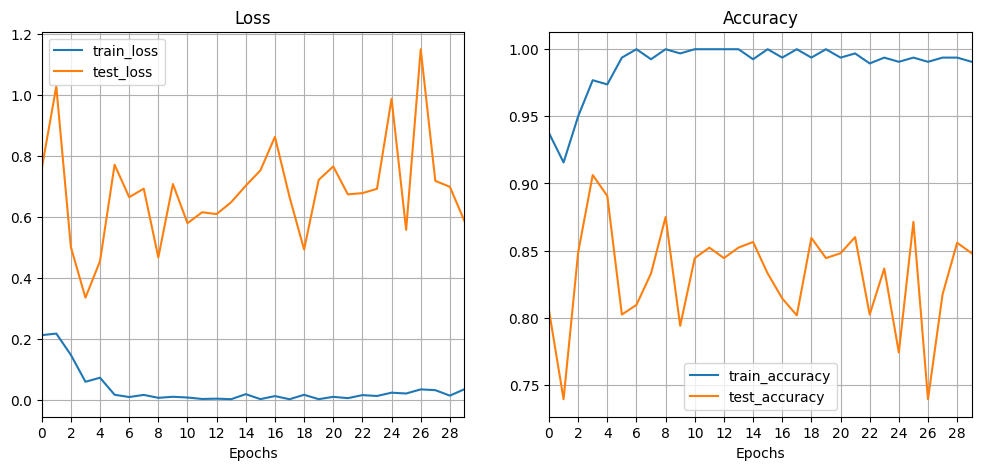

In [1120]:
plot_tl_loss_curves(transfer_learning_model_results[8])

Best test accuracy: 0.88%


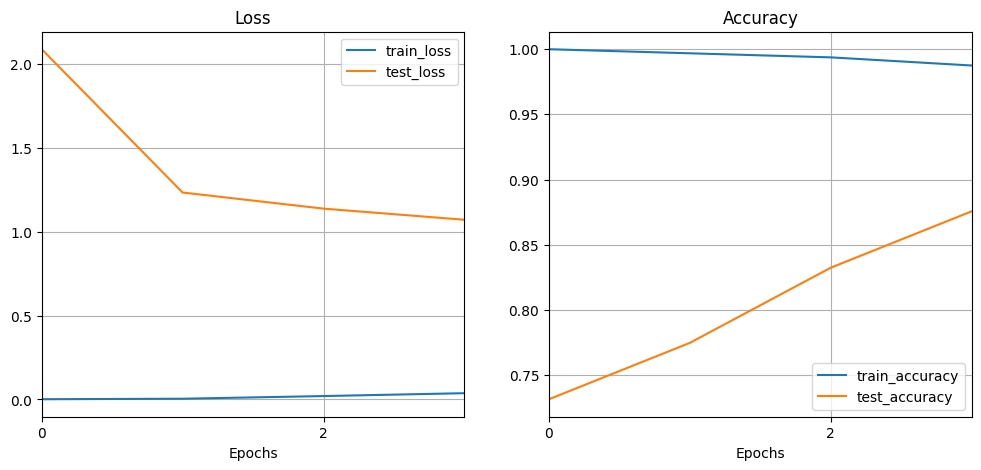

In [1123]:
plot_tl_loss_curves(transfer_learning_model_results[9])

Best test accuracy: 0.91%


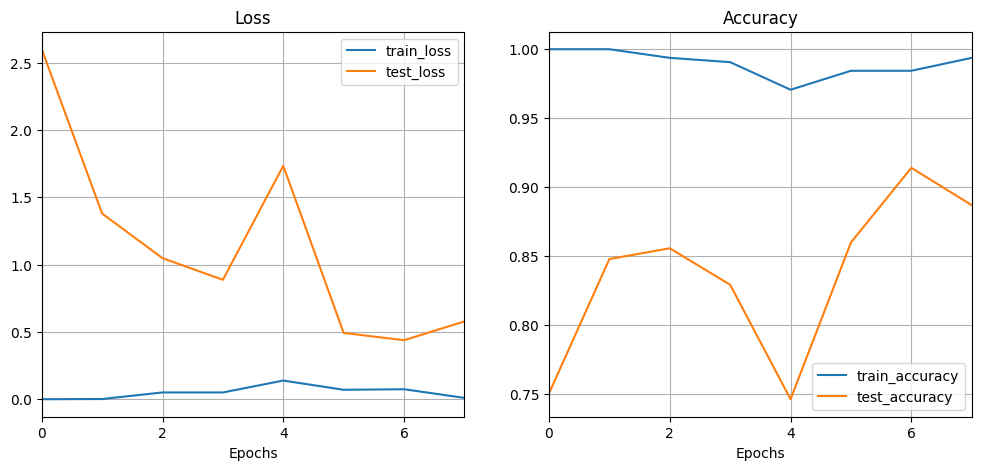

In [1125]:
plot_tl_loss_curves(transfer_learning_model_results[10])

# Comparing best transfer learning models with starting models

### Functions

In [1111]:
# Function to get the target model accuracy 
def get_model_accuracy(model, test_data, class_names):
    y_preds = []

    model.eval()
    with torch.inference_mode():
        for X, y in test_data.dataset:
            logits = model(X.unsqueeze(dim=0))
            pred_probs = torch.softmax(logits, dim=1)
            pred_label = torch.argmax(pred_probs, dim=1)
            y_preds.append(pred_label)

    y_pred_tensor = torch.cat(y_preds)
    confmat = ConfusionMatrix(task='multiclass', num_classes=len(class_names))
    confmat_tensor = confmat(preds=y_pred_tensor,
                            target=test_dataloader.dataset[:][1])

    confusion_matrix = confmat_tensor.numpy()

    # Number of classes
    num_classes = confusion_matrix.shape[0]

    # Calculate precision for each class
    precision_per_class = []
    for i in range(num_classes):
        tp = confusion_matrix[i, i]
        fp = sum(confusion_matrix[:, i]) - tp
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        precision_per_class.append(precision)

    # Macro-average precision
    macro_average_precision = np.mean(precision_per_class)

    # Weighted-average precision
    support = confusion_matrix.sum(axis=1)
    weighted_average_precision = np.sum(np.array(precision_per_class) * support) / np.sum(support)

    print(f"Precision per class:")
    print(f'Emiko: {(precision_per_class[0] * 100):.2f}%')
    print(f'Sekai: {(precision_per_class[1] * 100):.2f}%')
    print(f'Yuki: {(precision_per_class[2] * 100):.2f}%')
    print(f"Macro-average precision: {(macro_average_precision * 100):.2f}%")
    print(f"Weighted-average precision: {(weighted_average_precision * 100):.2f}%")

### Results

In [1112]:
# Top 2 transfer learning models
get_model_accuracy(pt_model_4, test_dataloader, class_names)

Precision per class:
Emiko: 85.37%
Sekai: 89.19%
Yuki: 87.10%
Macro-average precision: 87.22%
Weighted-average precision: 87.26%


In [1126]:
get_model_accuracy(pt_model_10, test_dataloader, class_names)

Precision per class:
Emiko: 84.44%
Sekai: 91.43%
Yuki: 89.66%
Macro-average precision: 88.51%
Weighted-average precision: 88.49%


In [1113]:
# Top 2 original models
get_model_accuracy(model_7, test_dataloader, class_names)

Precision per class:
Emiko: 81.40%
Sekai: 78.79%
Yuki: 51.52%
Macro-average precision: 70.57%
Weighted-average precision: 71.94%


In [1114]:
get_model_accuracy(V1_model_5, test_dataloader, class_names)

Precision per class:
Emiko: 93.33%
Sekai: 73.17%
Yuki: 52.63%
Macro-average precision: 73.05%
Weighted-average precision: 74.36%


# Visualising the outcomes of the best performing model

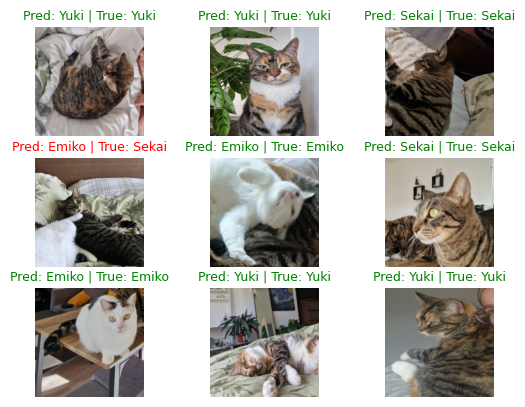

In [1128]:
eval_model(9, test_dataloader, pt_model_10, class_names)

(<Figure size 1000x700 with 1 Axes>,
 <Axes: xlabel='predicted label', ylabel='true label'>)

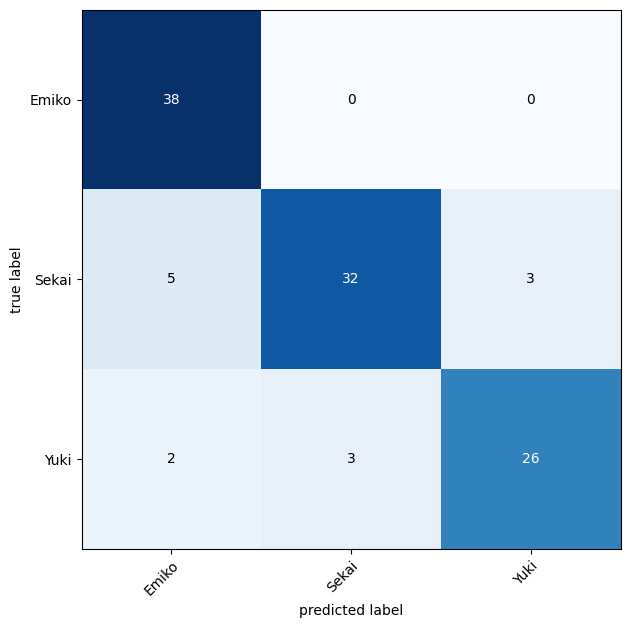

In [1129]:
generate_confmat(pt_model_10, test_dataloader, class_names)

# Conclusions

* The selection of images for training and testing may require some revision, as their specificity could be enhanced.

* Building a model from scratch yielded reasonably good results, but this required high-resolution training images (224x224). The limited number of training images likely hindered the model's performance.

* Fine-tuning a new model through transfer learning significantly boosted its performance and reduced training time.

* When training on the CPU, the two best models developed from scratch took 101 minutes and 32 minutes, respectively. In contrast, the best-performing model generated with transfer learning required only 9 minutes and 54 seconds, marking a substantial improvement in training efficiency.